In [1]:
import numpy as np, uproot as ur, awkward as ak, pandas as pd
import matplotlib.pyplot as plt
import os, sys
import pickle
import scipy.stats as st
from collections import defaultdict
from scipy.optimize import curve_fit
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle
from scipy.stats import poisson, norm
from scipy.spatial import ConvexHull


import mplhep as hep
plt.figure()
hep.style.use("CMS")
plt.close()

def gaus(x, amp, mean, sigma):
    return amp * np.exp( -(x - mean)**2 / (2*sigma**2) ) 

def phi_reconstruct(x, y, z):
    return np.degrees(np.arctan2(y, x))
    
def theta_reconstruct(x, y, z):
    return np.degrees(np.arccos(abs(z)/np.sqrt(x**2+y**2+z**2)))

def theta_x(x, y, z):
    return x/z

def theta_y(x, y, z):
    return y/z

def phi_reconstruct(x, y, z):
    return np.degrees(np.arctan2(y, x))

def theta_x_y(x, y, z):
    data = np.concatenate((np.array(x)[:, np.newaxis], 
                           np.array(y)[:, np.newaxis], 
                           np.array(z)[:, np.newaxis]), 
                          axis=1)
    datamean = data.mean(axis=0)
    centered_data = data - datamean

    _, _, vv = np.linalg.svd(centered_data)
    direction_vector = vv[0]
    if direction_vector[2] > 0:
        direction_vector *= -1
        
    x_vec, y_vec, z_vec = direction_vector
    
    tanx = theta_x(x_vec, y_vec, z_vec)
    tany = theta_y(x_vec, y_vec, z_vec)
    
    return tanx, tany

def vector_angle_reconstruct(x, y, z):
    data = np.concatenate((np.array(x)[:, np.newaxis], 
                           np.array(y)[:, np.newaxis], 
                           np.array(z)[:, np.newaxis]), 
                          axis=1)
    datamean = data.mean(axis=0)
    centered_data = data - datamean

    _, _, vv = np.linalg.svd(centered_data)
    direction_vector = vv[0]
    if direction_vector[2] > 0:
        direction_vector *= -1
        
    x_vec, y_vec, z_vec = direction_vector
    
    theta = theta_reconstruct(x_vec, y_vec, z_vec)
    phi = phi_reconstruct(x_vec, y_vec, z_vec)
    
    return theta, phi

def poisson_to_Z(N, lam):
    N = np.asarray(N, dtype=float)
    lam = np.asarray(lam, dtype=float)
    
    # Poisson CDF
    p = np.where(N >= lam,
                 poisson.cdf(N, lam),
                 1.0 - poisson.cdf(N, lam))
    
    # clip to avoid 0 or 1
    eps = 1e-16
    p = np.clip(p, eps, 1 - eps)
    
    # sign convention
    s = np.sign(lam - N)
    
    return s * norm.ppf(p)

def compute_kde_density(data, bandwidth, positions, phi_shape):
    values = np.vstack([np.array(data)[:,1], np.array(data)[:,0]])
    kernel = st.gaussian_kde(values)
    kernel.set_bandwidth(bw_method=bandwidth)
    density = np.reshape(kernel(positions).T, phi_shape)
    
    total_events = len(data)
    bin_area = (phi_grid[1]-phi_grid[0]) * (theta_grid[1]-theta_grid[0])
    return density * total_events * bin_area  # Convert to estimated counts

In [6]:
arrays = {}
simfile = '~/muography/data/square_4x4x8.root'
arrays['muon']=ur.open(simfile+":events").arrays()
#simfile = 'square_offset_2x4x8_shift_only.root'
#arrays['muons']=ur.open(simfile+":events").arrays()

In [82]:
simfile = '~/muography/data/square_2x4x8.root'
arrays['muonss']=ur.open(simfile+":events").arrays()

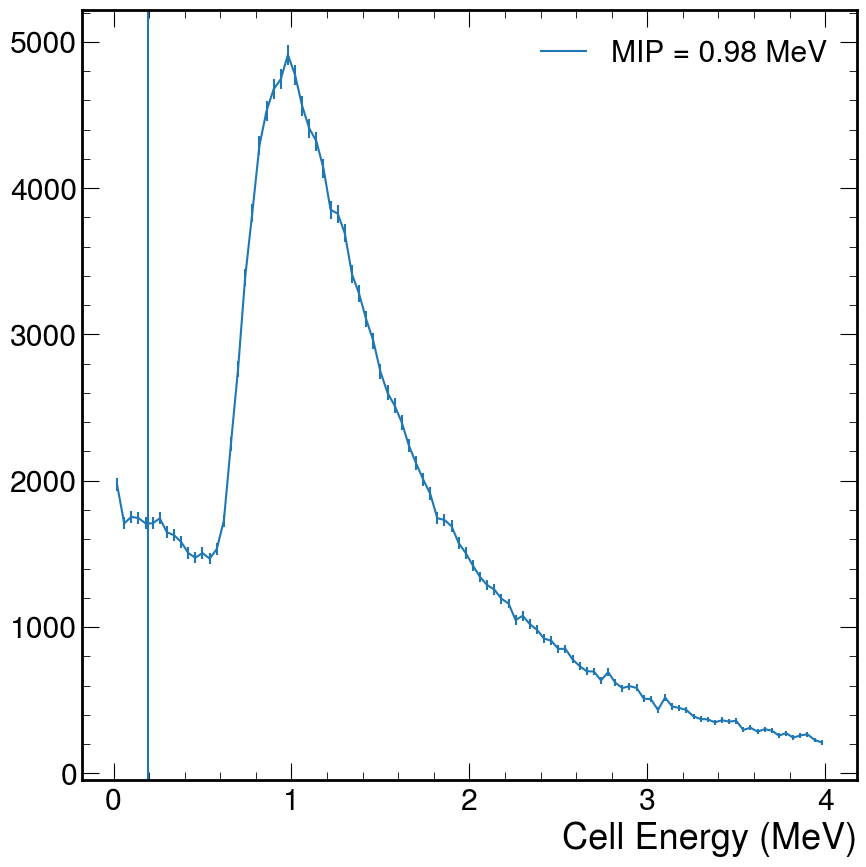

In [8]:
y,x=np.histogram(ak.flatten(arrays['muon']["MuographyHits.energy"]), bins=100, range=(0, 0.004))
bc=(x[1:]+x[:-1])/2
MIP=list(bc[y==max(y)])[0] 
plt.errorbar(np.array(bc)*1000,np.array(y),yerr=np.sqrt(y))
plt.axvline(0.2*MIP*1000,label=f'MIP = {MIP*1000:.2f} MeV')
plt.xlabel('Cell Energy (MeV)')
plt.legend()

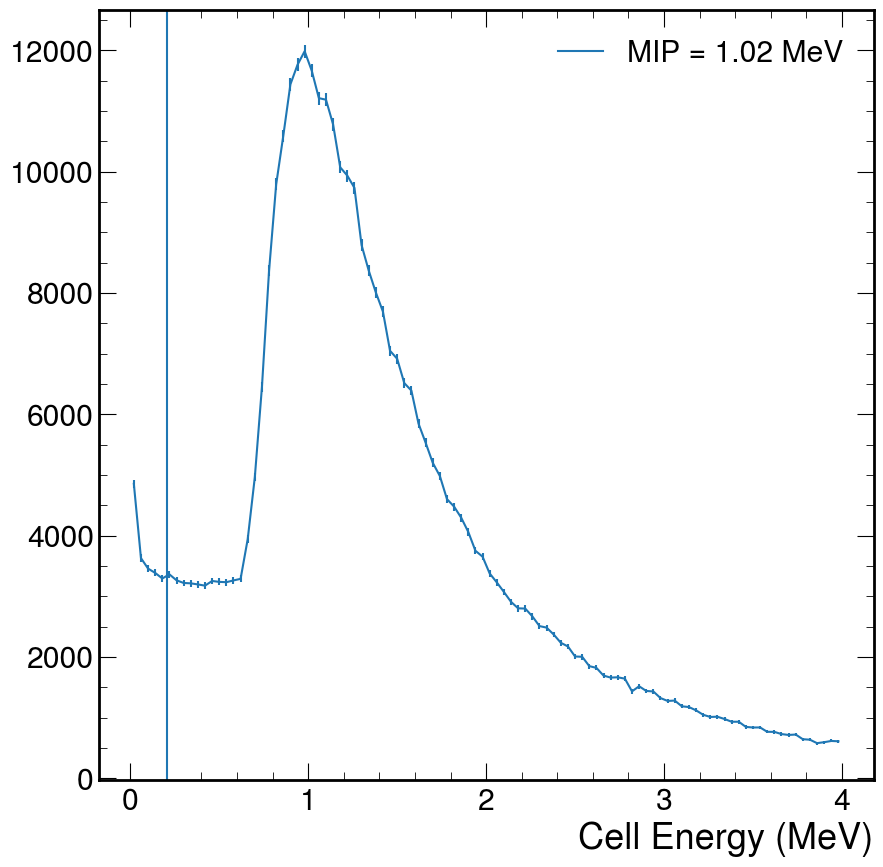

In [5]:
y,x=np.histogram(ak.flatten(arrays['muons']["HcalFarForwardZDCHitsContributions.energy"]), bins=100, range=(0, 0.004))
bc=(x[1:]+x[:-1])/2
_MIP=list(bc[y==max(y)])[0] 
plt.errorbar(np.array(bc)*1000,np.array(y),yerr=np.sqrt(y))
plt.axvline(0.2*MIP*1000,label=f'MIP = {MIP*1000:.2f} MeV')
plt.xlabel('Cell Energy (MeV)')
plt.legend()

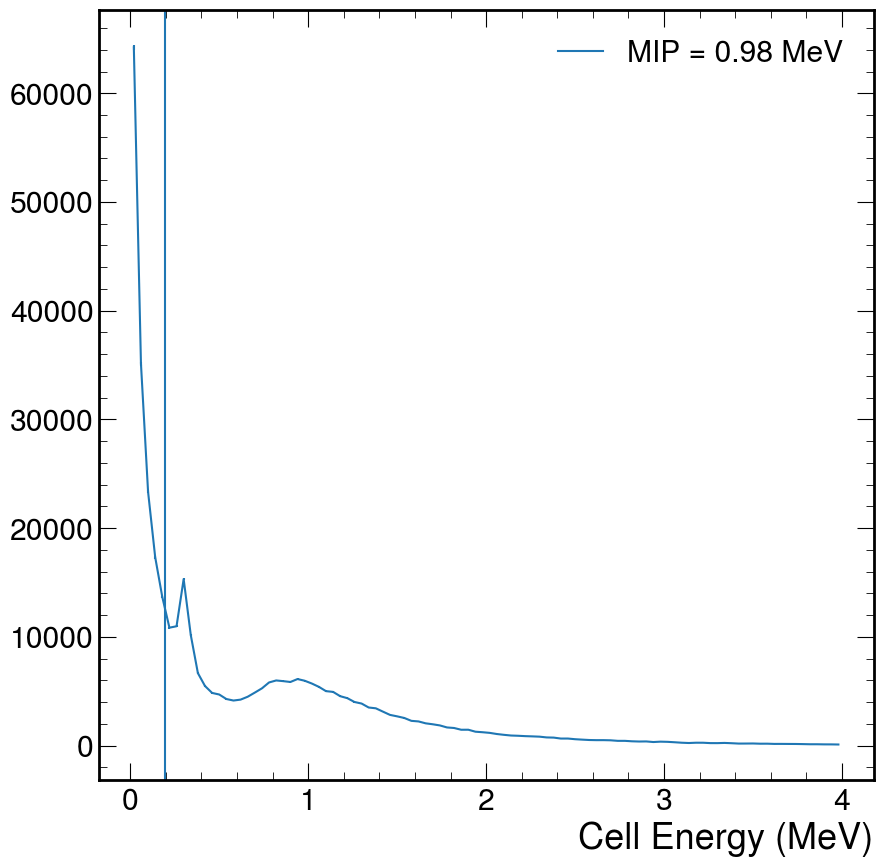

In [83]:
y,x=np.histogram(ak.flatten(arrays['muonss']["HcalFarForwardZDCHitsContributions.energy"]), bins=100, range=(0, 0.004))
bc=(x[1:]+x[:-1])/2
__MIP=list(bc[y==max(y)])[0] 
plt.errorbar(np.array(bc)*1000,np.array(y),yerr=np.sqrt(y))
plt.axvline(0.2*MIP*1000,label=f'MIP = {MIP*1000:.2f} MeV')
plt.xlabel('Cell Energy (MeV)')
plt.legend()

In [86]:
__data_energy = arrays['muonss'][f'HcalFarForwardZDCHits.energy']
__data_MIP_cut = __data_energy > 0.5*__MIP
__data_cell_cut = [True if len(cells)>=2 else False for cells in arrays['muonss'][f"HcalFarForwardZDCHits.energy"][__data_MIP_cut]]
__data_x = arrays['muonss'][f'HcalFarForwardZDCHits.position.x'][np.array(__data_cell_cut)]
__data_y = arrays['muonss'][f'HcalFarForwardZDCHits.position.y'][np.array(__data_cell_cut)]
__data_z = arrays['muonss'][f'HcalFarForwardZDCHits.position.z'][np.array(__data_cell_cut)]    
__reco_data_angle = np.array([vector_angle_reconstruct(np.array(xi,dtype=float), np.array(yi,dtype=float), np.array(zi,dtype=float)) for xi, yi, zi in zip(__data_x,__data_y,__data_z)])
__status = arrays['muonss']["MCParticles.generatorStatus"]
__mc_px = arrays['muonss']["MCParticles.momentum.x"][__status==1][np.array(__data_cell_cut)]
__mc_py = arrays['muonss']["MCParticles.momentum.y"][__status==1][np.array(__data_cell_cut)]
__mc_pz = arrays['muonss']["MCParticles.momentum.z"][__status==1][np.array(__data_cell_cut)]
__mc_theta = theta_reconstruct(__mc_px,__mc_py,__mc_pz)
__mc_phi = phi_reconstruct(__mc_px,__mc_py,__mc_pz)
__mc_x = arrays['muonss']["MCParticles.vertex.x"][__status==1][np.array(__data_cell_cut)]
__mc_y = arrays['muonss']["MCParticles.vertex.y"][__status==1][np.array(__data_cell_cut)]
__mc_z = arrays['muonss']["MCParticles.vertex.z"][__status==1][np.array(__data_cell_cut)]

In [8]:
_data_energy = arrays['muons'][f'HcalFarForwardZDCHits.energy']
_data_MIP_cut = _data_energy > 0.2*_MIP
_data_cell_cut = [True if len(cells)>=2 else False for cells in arrays['muons'][f"HcalFarForwardZDCHits.energy"][_data_MIP_cut]]
_data_x = arrays['muons'][f'HcalFarForwardZDCHits.position.x'][np.array(_data_cell_cut)]
_data_y = arrays['muons'][f'HcalFarForwardZDCHits.position.y'][np.array(_data_cell_cut)]
_data_z = arrays['muons'][f'HcalFarForwardZDCHits.position.z'][np.array(_data_cell_cut)]    
_reco_data_angle = np.array([vector_angle_reconstruct(np.array(xi,dtype=float), np.array(yi,dtype=float), np.array(zi,dtype=float)) for xi, yi, zi in zip(_data_x,_data_y,_data_z)])
_status = arrays['muons']["MCParticles.generatorStatus"]
_mc_px = arrays['muons']["MCParticles.momentum.x"][_status==1][np.array(_data_cell_cut)]
_mc_py = arrays['muons']["MCParticles.momentum.y"][_status==1][np.array(_data_cell_cut)]
_mc_pz = arrays['muons']["MCParticles.momentum.z"][_status==1][np.array(_data_cell_cut)]
_mc_theta = theta_reconstruct(_mc_px,_mc_py,_mc_pz)
_mc_phi = phi_reconstruct(_mc_px,_mc_py,_mc_pz)
_mc_x = arrays['muons']["MCParticles.vertex.x"][_status==1][np.array(_data_cell_cut)]
_mc_y = arrays['muons']["MCParticles.vertex.y"][_status==1][np.array(_data_cell_cut)]
_mc_z = arrays['muons']["MCParticles.vertex.z"][_status==1][np.array(_data_cell_cut)]

In [2]:
data_energy = arrays['muon'][f'MuographyHits.energy']

sigma = 0.56

# flatten to numpy
flat = ak.to_numpy(data_energy.layout.content)
noise = np.random.normal(0, sigma, size=len(flat))*MIP

# add noise
flat_smear = flat + noise

# rebuild jagged array
offsets = ak.to_numpy(data_energy.layout.offsets)  # convert Index64 → numpy
lengths = offsets[1:] - offsets[:-1]
data_energy_smear = ak.unflatten(flat_smear, lengths)

data_MIP_cut = data_energy_smear > 1*MIP
data_cell_cut = [True if len(cells)>=2 else False for cells in arrays['muon'][f"MuographyHits.energy"][data_MIP_cut]]

NameError: name 'arrays' is not defined

In [3]:
data_x = arrays['muon'][f'MuographyHits.position.x'][np.array(data_cell_cut)]
data_y = arrays['muon'][f'MuographyHits.position.y'][np.array(data_cell_cut)]
data_z = arrays['muon'][f'MuographyHits.position.z'][np.array(data_cell_cut)]    
reco_data_angle = np.array([vector_angle_reconstruct(np.array(xi,dtype=float), np.array(yi,dtype=float), np.array(zi,dtype=float)) for xi, yi, zi in zip(data_x,data_y,data_z)])


NameError: name 'arrays' is not defined

In [89]:
status = arrays['muon']["MCParticles.generatorStatus"]
mc_px = arrays['muon']["MCParticles.momentum.x"][status==1][np.array(data_cell_cut)]
mc_py = arrays['muon']["MCParticles.momentum.y"][status==1][np.array(data_cell_cut)]
mc_pz = arrays['muon']["MCParticles.momentum.z"][status==1][np.array(data_cell_cut)]
mc_theta = theta_reconstruct(mc_px,mc_py,mc_pz)
mc_phi = phi_reconstruct(mc_px,mc_py,mc_pz)

In [90]:
mc_x = arrays['muon']["MCParticles.vertex.x"][status==1][np.array(data_cell_cut)]
mc_y = arrays['muon']["MCParticles.vertex.y"][status==1][np.array(data_cell_cut)]
mc_z = arrays['muon']["MCParticles.vertex.z"][status==1][np.array(data_cell_cut)]

In [17]:
data_energy_sum = [sum(cells)*1000 if len(cells)>=2 else False for cells in data_energy_smear[data_MIP_cut]]

In [64]:
df = pd.read_pickle('data/training/merge.pkl')
pos_theta = df['MuographyHits.theta']
pos_phi = df['MuographyHits.phi']
mc_theta_ = df['MCParticles.theta']
mc_phi_ = df['MCParticles.phi']


Fit parameters: A=9.805, k=0.059, C=1.501


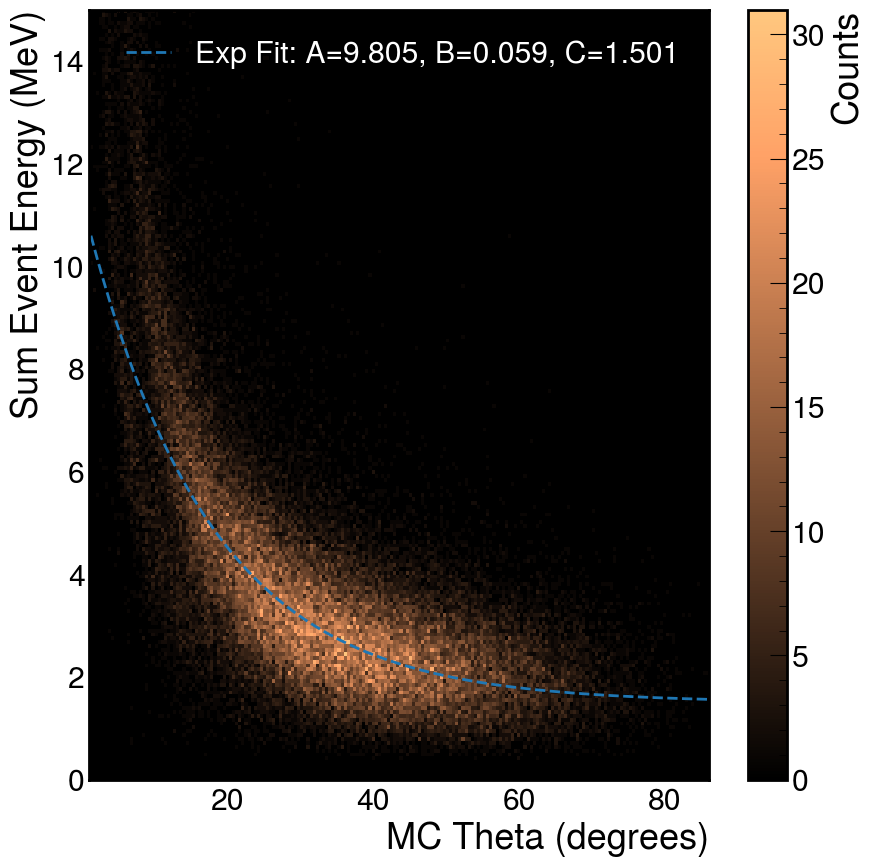

In [34]:
H, xedges, yedges = np.histogram2d(
    np.array(np.concatenate(mc_theta)),
    np.array(data_energy_sum)[np.array(data_cell_cut)],
    bins=(200, np.linspace(0,15,200))
)

X, Y = np.meshgrid(xedges, yedges)

plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label='Counts')
plt.xlabel("MC Theta (degrees)")
plt.ylabel('Sum Event Energy (MeV)')
#plt.yscale('log')


peak_indices = np.argmax(H, axis=1)
theta_centers = 0.5 * (xedges[:-1] + xedges[1:])
energy_centers = 0.5 * (yedges[:-1] + yedges[1:])
E_peaks = energy_centers[peak_indices]
def exp_decay(theta, A, k, C):
    return A * np.exp(-k * theta) + C
# Remove NaNs or weird edges
mask = np.isfinite(E_peaks)
theta_fit = theta_centers[mask]
E_fit = E_peaks[mask]

popt, pcov = curve_fit(exp_decay, theta_fit, E_fit, p0=(10, 0.05, 0))
A, k, C = popt
print("Fit parameters: A=%.3f, k=%.3f, C=%.3f" % (A, k, C))
theta_smooth = np.linspace(theta_fit.min(), theta_fit.max(), 300)
plt.plot(theta_smooth, exp_decay(theta_smooth, *popt), '--', lw=2, label="Exp Fit: A=%.3f, B=%.3f, C=%.3f" % (A, k, C))
legend = plt.legend(facecolor="black", edgecolor="white")
for text in legend.get_texts():
    text.set_color("white")

/tmp/ipykernel_2887553/2598758279.py:2: RuntimeWarning: invalid value encountered in log
  return -(1.0 / k) * np.log((E - C) / A)


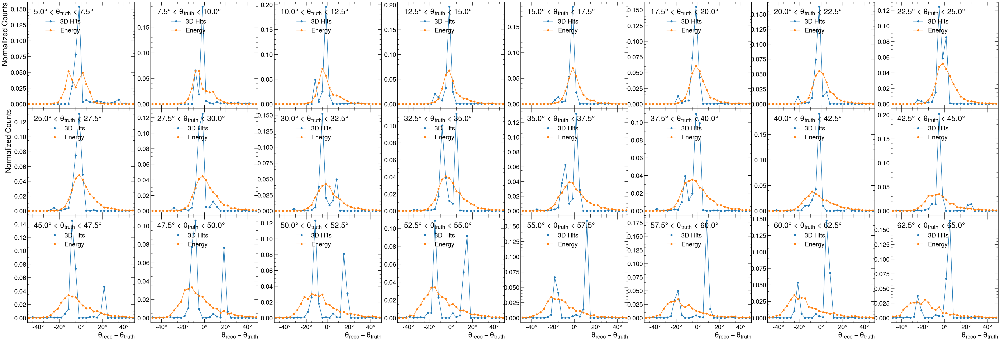

In [44]:
def theta_from_energy(E, A, k, C):
    return -(1.0 / k) * np.log((E - C) / A)
    
binsize = 2.5
bin = []
rms = []
mea = []
fits = []
binnum = 30
max_bin = 65
fig, ax = plt.subplots(3,8,figsize=(60,20),sharex=True,sharey=False)
#plt.suptitle('Square Offset 4x16 Detector',fontsize=60)
for i in range(24):
    plt.sca(ax[i//8,i%8])
    bin.append(i*binsize+5+binsize/2)
    cut = (((i) * binsize + 5 <= np.array(np.concatenate(mc_theta))) & (np.array(np.concatenate(mc_theta)) < (i+1) * binsize + 5))
    y,x = np.histogram(reco_data_angle[:,0][cut]-mc_theta[cut],bins=binnum,range=(-50,50),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label='3D Hits')
    means = np.array(reco_data_angle[:,0][cut]-mc_theta[cut])
    rms.append(np.std(means))
    mea.append(np.mean(means))
    coeff, _ = curve_fit(gaus,np.array(bc),np.array(y),p0=(0.1,0,100))
    fits.append(coeff)
    #x=np.linspace(-50,50,100)
    #plt.errorbar(x,gaus(x,*coeff),fmt='--',label='3D Hits Fit')
    
    y,x = np.histogram(theta_from_energy(np.array(data_energy_sum)[np.array(data_cell_cut)],*popt)[cut]-mc_theta[cut],bins=binnum,range=(-50,50),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'Energy')
    means = np.array(theta_from_energy(np.array(data_energy_sum)[np.array(data_cell_cut)],*popt)[cut]-mc_theta[cut])
    rms.append(np.nanstd(means))
    mea.append(np.nanmean(means))
    coeff, _ = curve_fit(gaus,np.array(bc),np.array(y),p0=(0.1,0,10))
    fits.append(coeff)
    #x=np.linspace(-50,50,100)
    #plt.errorbar(x,gaus(x,*coeff),fmt='--',label='Energy Fit')

    plt.xlabel(r'$\theta_{reco} - \theta_{truth}$')
    plt.legend(title=rf'{i * binsize+5}$\degree$ < $\theta_{{truth}}$ < {(i+1) * binsize+5}$\degree$', loc = 'upper left')
    plt.xlim(-50,50)
fig.subplots_adjust(wspace=0.15,hspace=0)

ax[0,0].set_ylabel('Normalized Counts')
ax[1,0].set_ylabel('Normalized Counts')
#ax[2,0].set_ylabel('Normalized Counts')

import matplotlib.ticker as mticker
def degree_formatter(x, pos):
    return rf"{int(x)}$\degree$" 
for axi in ax.flat:
    axi.xaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))

plt.savefig('ThetaResolution_differential.pdf',format='pdf')

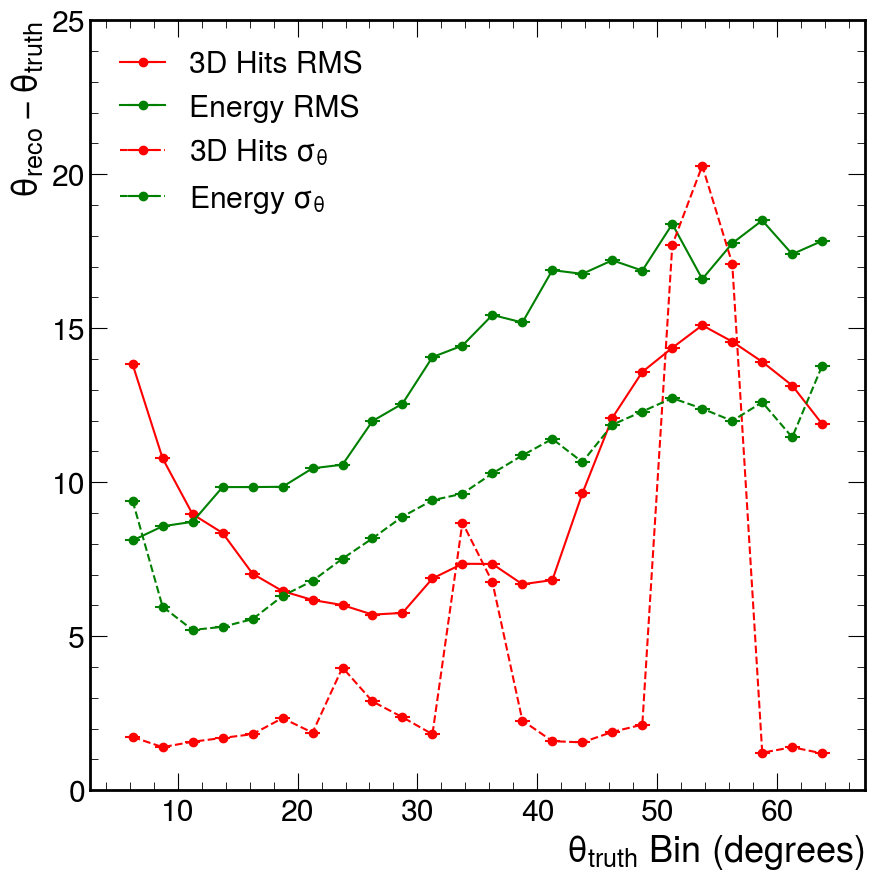

In [45]:
plt.errorbar(bin,rms[::2],xerr=(bin[1]-bin[0])/4,label='3D Hits RMS',fmt='-o',c='r')
plt.errorbar(bin,rms[1::2],xerr=(bin[1]-bin[0])/4,label='Energy RMS',fmt='-o',c='g')
plt.errorbar(bin,abs(np.array(fits)[:,2][::2]),xerr=(bin[1]-bin[0])/4,label=r'3D Hits $\sigma_{\theta}$',fmt='--o',c='r')
plt.errorbar(bin,abs(np.array(fits)[:,2][1::2]),xerr=(bin[1]-bin[0])/4,label=r'Energy $\sigma_{\theta}$',fmt='--o',c='g')
plt.xlabel(rf'$\theta_{{truth}}$ Bin (degrees)')
plt.ylabel(r'$\theta_{reco} - \theta_{truth}$')
plt.ylim(bottom=0,top=25)
plt.legend()

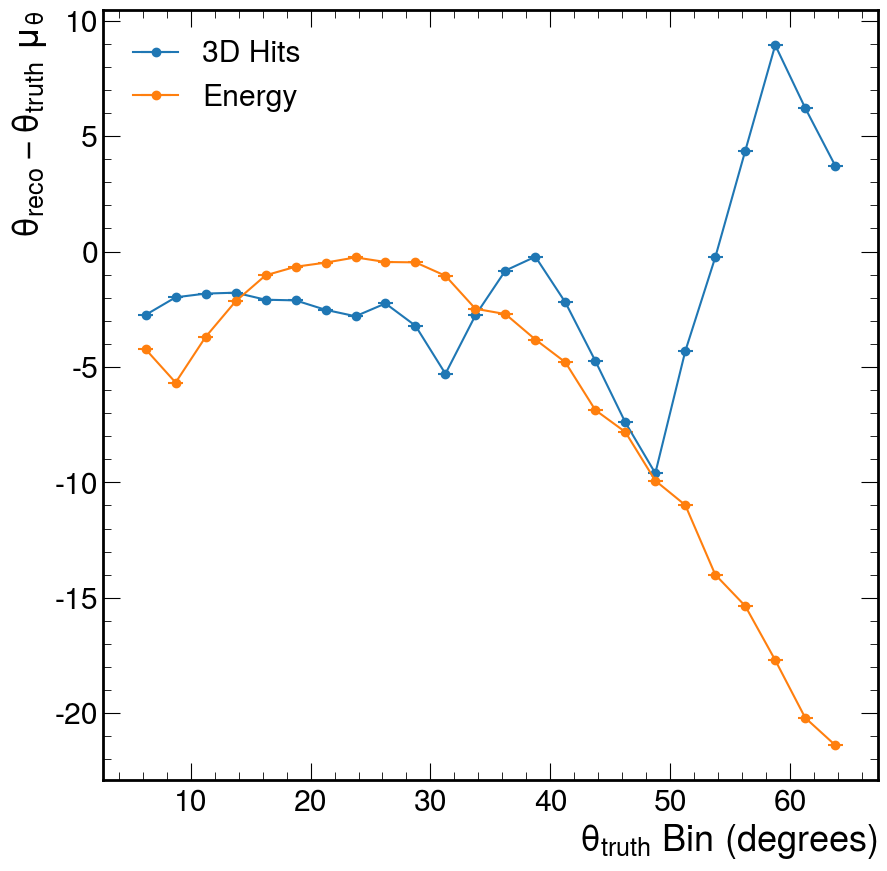

In [47]:
plt.errorbar(bin,np.array(fits)[:,1][::2],xerr=(bin[1]-bin[0])/4,label='3D Hits',fmt='-o')
plt.errorbar(bin,np.array(fits)[:,1][1::2],xerr=(bin[1]-bin[0])/4,label='Energy',fmt='-o')
plt.xlabel(rf'$\theta_{{truth}}$ Bin (degrees)')
plt.ylabel(r'$\theta_{reco} - \theta_{truth}$ $\mu_{\theta}$')
#plt.ylim(bottom=0)
plt.legend()

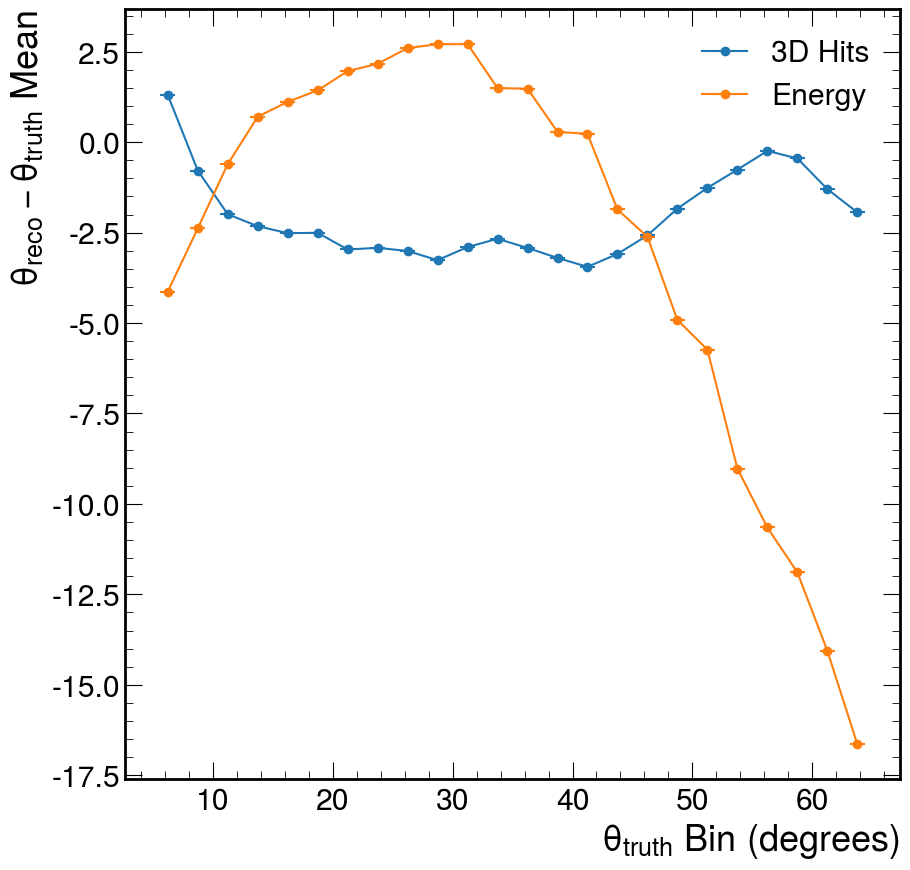

In [48]:
plt.errorbar(bin,mea[::2],xerr=(bin[1]-bin[0])/4,label='3D Hits',fmt='-o')
plt.errorbar(bin,mea[1::2],xerr=(bin[1]-bin[0])/4,label='Energy',fmt='-o')
plt.xlabel(rf'$\theta_{{truth}}$ Bin (degrees)')
plt.ylabel(r'$\theta_{reco} - \theta_{truth}$ Mean')
plt.legend()

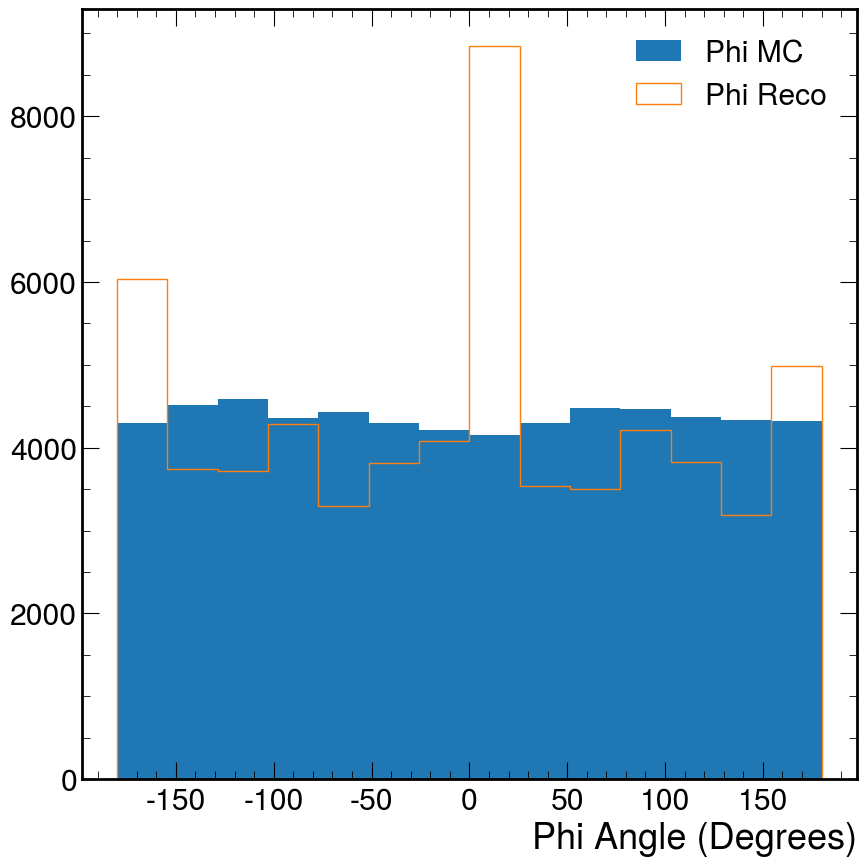

In [63]:
plt.hist(mc_phi,bins=np.linspace(-180, 180, 15),label='Phi MC')
plt.hist(reco_data_angle[:,1],bins=np.linspace(-180, 180, 15),label='Phi Reco',histtype='step')

plt.xlabel('Phi Angle (Degrees)')
plt.legend()

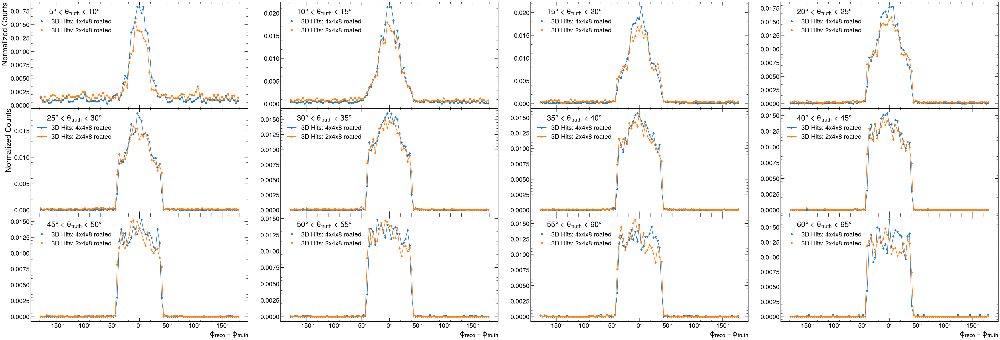

In [91]:
binsize = 5
binnum = np.linspace(-180,180,100)
max_bin = 65
fig, ax = plt.subplots(3,4,figsize=(60,20),sharex=True,sharey=False)
#plt.suptitle('Square Offset 4x16 Detector',fontsize=60)
for i in range(12):
    plt.sca(ax[i//4,i%4])
    bin.append(i*binsize+5+binsize/2)
    cut = (((i) * binsize+5 <= np.array(np.concatenate(mc_theta))) & (np.array(np.concatenate(mc_theta)) < (i+1) * binsize+5))
    y,x = np.histogram(reco_data_angle[:,1][cut]-mc_phi[cut],bins=binnum,density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label='3D Hits: 4x4x8 roated')
    '''
    cut = (((i) * binsize+5 <= mc_theta_) & (mc_theta_ < (i+1) * binsize+5))
    y,x = np.histogram(pos_phi[cut]-mc_phi_[cut],bins=binnum,density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label='3D Hits: GNN Trained')
    '''
    cut = (((i) * binsize+5 <= np.array(np.concatenate(__mc_theta))) & (np.array(np.concatenate(__mc_theta)) < (i+1) * binsize+5))
    y,x = np.histogram(__reco_data_angle[:,1][cut]-__mc_phi[cut],bins=binnum,density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label='3D Hits: 2x4x8 roated')

    plt.xlabel(r'$\phi_{reco} - \phi_{truth}$')
    plt.legend(title=rf'{i * binsize+5}$\degree$ < $\theta_{{truth}}$ < {(i+1) * binsize+5}$\degree$', loc = 'upper left')
    #plt.xlim(-50,50)
fig.subplots_adjust(wspace=0.15,hspace=0)

ax[0,0].set_ylabel('Normalized Counts')
ax[1,0].set_ylabel('Normalized Counts')
#ax[2,0].set_ylabel('Normalized Counts')

import matplotlib.ticker as mticker
def degree_formatter(x, pos):
    return rf"{int(x)}$\degree$" 
for axi in ax.flat:
    axi.xaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))

#plt.savefig('ThetaResolution_differential.pdf',format='pdf')

In [74]:
import uproot
num = 10000
for i in range(int(len(mc_theta)/num)):
    print(f"Processing: {i}", end='\r')
    branches = {
        "MuographyHits.position.x": data_x[i*num:(i+1)*num],
        "MuographyHits.position.y": data_y[i*num:(i+1)*num],
        "MuographyHits.position.z": data_z[i*num:(i+1)*num],
        "MuographyHits.energy": data_energy[np.array(data_cell_cut)][i*num:(i+1)*num],
        "MuographyHits.energy_smear": data_energy_smear[np.array(data_cell_cut)][i*num:(i+1)*num],
        "MuographyHits.time": arrays['muon']["HcalFarForwardZDCHitsContributions.time"][np.array(data_cell_cut)][i*num:(i+1)*num],
        "MuographyHits.theta": ak.Array(reco_data_angle[:,0])[i*num:(i+1)*num],
        "MuographyHits.phi": ak.Array(reco_data_angle[:,1])[i*num:(i+1)*num], 
        "MCParticles.theta": mc_theta[i*num:(i+1)*num],
        "MCParticles.phi": mc_phi[i*num:(i+1)*num],
        "MCParticles.generatorStatus": arrays['muon']["MCParticles.generatorStatus"][np.array(data_cell_cut)][i*num:(i+1)*num],
        "MCParticles.PDG": arrays['muon']["MCParticles.PDG"][np.array(data_cell_cut)][i*num:(i+1)*num],
        "MCParticles.mass": arrays['muon']["MCParticles.mass"][np.array(data_cell_cut)][i*num:(i+1)*num],
        "MCParticles.momentum.x": arrays['muon']["MCParticles.momentum.x"][np.array(data_cell_cut)][i*num:(i+1)*num],
        "MCParticles.momentum.y": arrays['muon']["MCParticles.momentum.y"][np.array(data_cell_cut)][i*num:(i+1)*num],
        "MCParticles.momentum.z": arrays['muon']["MCParticles.momentum.z"][np.array(data_cell_cut)][i*num:(i+1)*num]
    }
    
    
    with uproot.recreate(f'training/square_offset_rotated_{i}.root') as fout:
        fout["events"] = branches

Text(1, 0, 'reco theta')

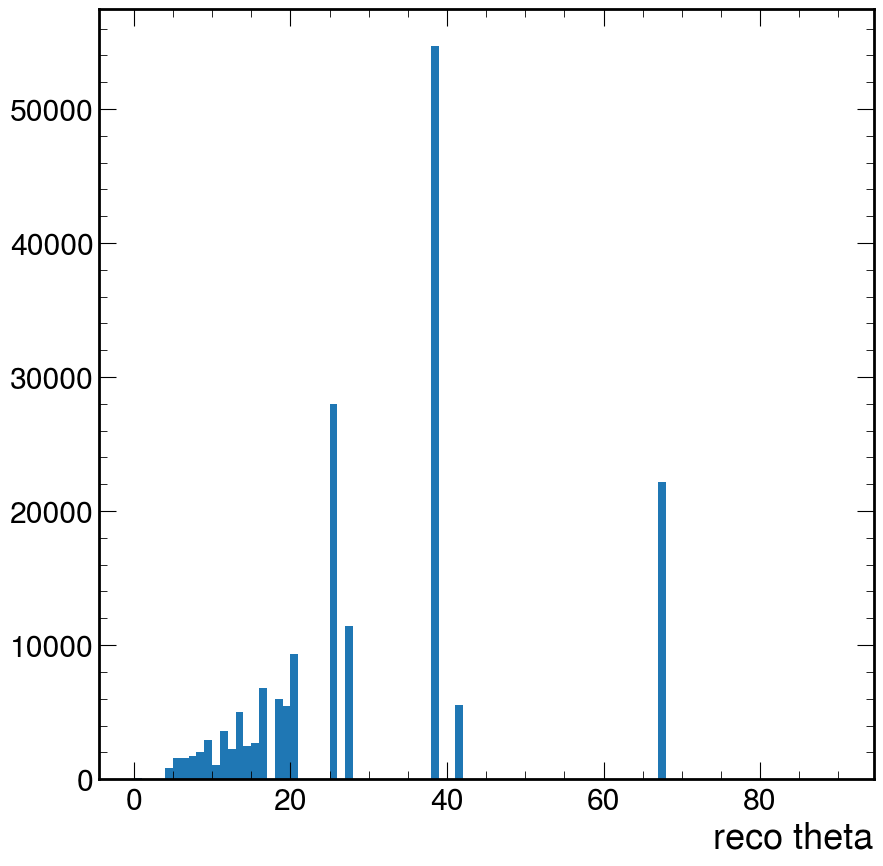

In [8]:
plt.hist(reco_data_angle[:,0],bins=np.linspace(0,90,91))
plt.xlabel('reco theta')

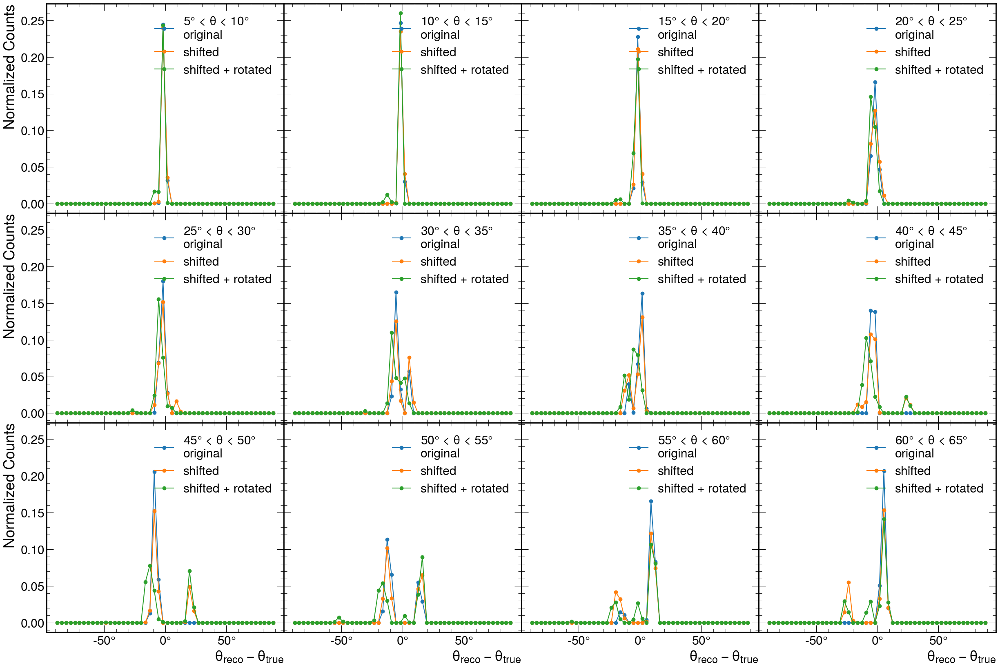

In [22]:
binsize = 5
bin = []
sig = []
mea = []
sig_e = []
mea_e = []
max_bin = 60
fig, ax = plt.subplots(3,4,figsize=(30,20),sharex=True,sharey=True)
#plt.suptitle('Square Offset 4x16 Detector',fontsize=60)
for i in range(12):
    plt.sca(ax[i//4,i%4])
    cut = (((i+1) * binsize <= ak.flatten(mc_theta)) & (ak.flatten(mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(reco_data_angle[:,0][cut]-mc_theta[cut],bins=50,range=(-90,90),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$' +'\n'+f'original')
    '''
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin.append((i+0.5) * binsize)
        sig.append(coeff[2])
        mea.append(coeff[1])
        sig_e.append(covar[2][2])
        mea_e.append(covar[1][1])
        plt.errorbar(bc,y/coeff[0],yerr=np.sqrt(y)/coeff[0], fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$')
        plt.errorbar(np.linspace(-20,20,100),gaus(np.linspace(-20,20,100),*coeff)/coeff[0],fmt='--',label=rf'$\mu$ = {coeff[1]:.1f}$\degree$'+'\n'+rf'$\sigma$ = {abs(coeff[2]):.1f}$\degree$')
    except: continue
    '''
    cut = (((i+1) * binsize <= ak.flatten(_mc_theta)) & (ak.flatten(_mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(_reco_data_angle[:,0][cut]-_mc_theta[cut],bins=50,range=(-90,90),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'shifted')
    '''
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin.append((i+0.5) * binsize)
        sig.append(coeff[2])
        mea.append(coeff[1])
        sig_e.append(covar[2][2])
        mea_e.append(covar[1][1])
        plt.errorbar(bc,y/coeff[0],yerr=np.sqrt(y)/coeff[0], fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$')
        plt.errorbar(np.linspace(-20,20,100),gaus(np.linspace(-20,20,100),*coeff)/coeff[0],fmt='--',label=rf'$\mu$ = {coeff[1]:.1f}$\degree$'+'\n'+rf'$\sigma$ = {abs(coeff[2]):.1f}$\degree$')
    except: continue
    '''
    cut = (((i+1) * binsize <= ak.flatten(__mc_theta)) & (ak.flatten(__mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(__reco_data_angle[:,0][cut]-__mc_theta[cut],bins=50,range=(-90,90),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'shifted + rotated')
    
    plt.xlabel(r'$\theta_{reco} - \theta_{true}$')
    plt.legend(loc = 'upper right')
fig.subplots_adjust(wspace=0,hspace=0)

ax[0,0].set_ylabel('Normalized Counts')
ax[1,0].set_ylabel('Normalized Counts')
ax[2,0].set_ylabel('Normalized Counts')

import matplotlib.ticker as mticker
def degree_formatter(x, pos):
    return rf"{int(x)}$\degree$" 
for axi in ax.flat:
    axi.xaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))




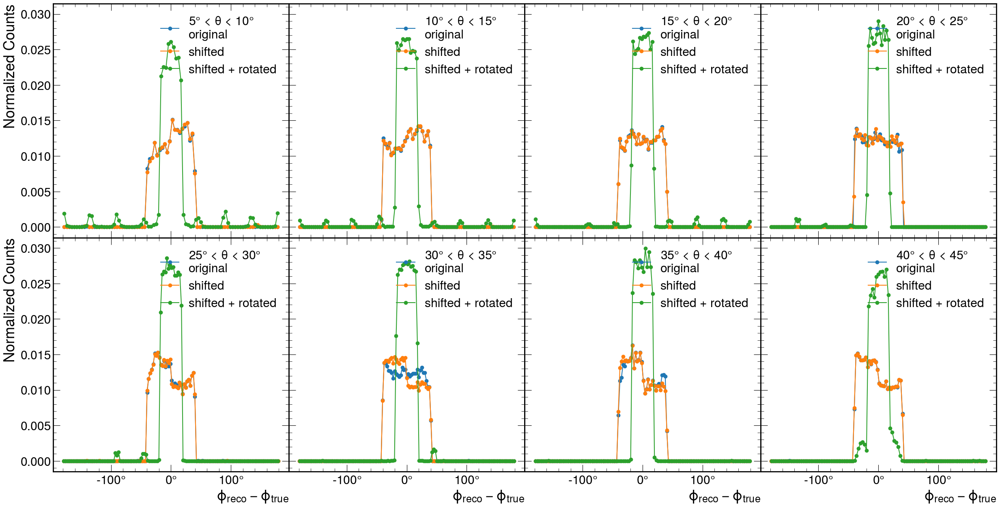

In [24]:
binsize = 5
bin = []
sig = []
mea = []
sig_e = []
mea_e = []
max_bin = 55
fig, ax = plt.subplots(2,4,figsize=(30,15),sharex=True,sharey=True)
#plt.suptitle('Square Offset 4x16 Detector',fontsize=60)
for i in range(8):
    plt.sca(ax[i//4,i%4])
    cut = (((i+1) * binsize <= ak.flatten(mc_theta)) & (ak.flatten(mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(reco_data_angle[:,1][cut]-mc_phi[cut],bins=int(np.sqrt(len(mc_phi[cut]))),range=(-180,180),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$' +'\n'+f'original')
    '''
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin.append((i+0.5) * binsize)
        sig.append(coeff[2])
        mea.append(coeff[1])
        sig_e.append(covar[2][2])
        mea_e.append(covar[1][1])
        plt.errorbar(bc,y/coeff[0],yerr=np.sqrt(y)/coeff[0], fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$')
        plt.errorbar(np.linspace(-20,20,100),gaus(np.linspace(-20,20,100),*coeff)/coeff[0],fmt='--',label=rf'$\mu$ = {coeff[1]:.1f}$\degree$'+'\n'+rf'$\sigma$ = {abs(coeff[2]):.1f}$\degree$')
    except: continue
    '''
    cut = (((i+1) * binsize <= ak.flatten(_mc_theta)) & (ak.flatten(_mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(_reco_data_angle[:,1][cut]-_mc_phi[cut],bins=int(np.sqrt(len(_mc_phi[cut]))),range=(-180,180),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'shifted')
    '''
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin.append((i+0.5) * binsize)
        sig.append(coeff[2])
        mea.append(coeff[1])
        sig_e.append(covar[2][2])
        mea_e.append(covar[1][1])
        plt.errorbar(bc,y/coeff[0],yerr=np.sqrt(y)/coeff[0], fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$')
        plt.errorbar(np.linspace(-20,20,100),gaus(np.linspace(-20,20,100),*coeff)/coeff[0],fmt='--',label=rf'$\mu$ = {coeff[1]:.1f}$\degree$'+'\n'+rf'$\sigma$ = {abs(coeff[2]):.1f}$\degree$')
    except: continue
    '''
    cut = (((i+1) * binsize <= ak.flatten(__mc_theta)) & (ak.flatten(__mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(__reco_data_angle[:,1][cut]-__mc_phi[cut],bins=int(np.sqrt(len(__mc_phi[cut]))),range=(-180,180),density=True)
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y, fmt='-o',label=rf'shifted + rotated')
    
    plt.xlabel(r'$\phi_{reco} - \phi_{true}$')
    plt.legend(loc = 'upper right')
fig.subplots_adjust(wspace=0,hspace=0)

ax[0,0].set_ylabel('Normalized Counts')
ax[1,0].set_ylabel('Normalized Counts')
import matplotlib.ticker as mticker
def degree_formatter(x, pos):
    return rf"{int(x)}$\degree$" 
for axi in ax.flat:
    axi.xaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))




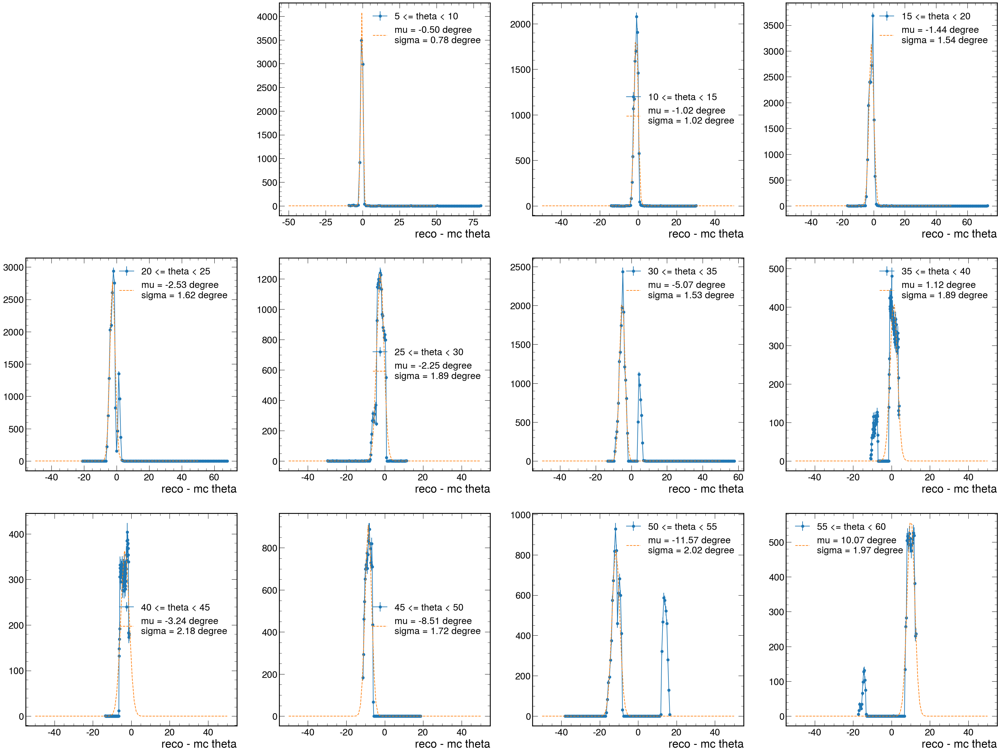

In [10]:
binsize = 5
bin = []
sig = []
mea = []
sig_e = []
mea_e = []
max_bin = 60
fig, ax = plt.subplots(3,int(max_bin/binsize/3),figsize=(10*int(max_bin/binsize/3),30))
#plt.suptitle('Square Offset 4x16 Detector',fontsize=60)
for i in range(int(max_bin/binsize)):
    plt.sca(ax[i//int(max_bin/binsize/3),i%int(max_bin/binsize/3)])
    cut = ((i * binsize <= ak.flatten(mc_theta)) & (ak.flatten(mc_theta) < (i + 1) * binsize))
    y,x = np.histogram(reco_data_angle[:,0][cut]-mc_theta[cut],bins=int(np.sqrt(len(mc_theta[cut]))))
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'{i * binsize} <= theta < {(i + 1) * binsize}')
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin.append((i+0.5) * binsize)
        sig.append(coeff[2])
        mea.append(coeff[1])
        sig_e.append(covar[2][2])
        mea_e.append(covar[1][1])
        plt.errorbar(np.linspace(-50,50,100),gaus(np.linspace(-50,50,100),*coeff),fmt='--',label=f'mu = {coeff[1]:.2f} degree' +'\n'+f'sigma = {abs(coeff[2]):.2f} degree')
    except: continue
    plt.xlabel('reco - mc theta')
    plt.legend()
fig.delaxes(ax[0,0])

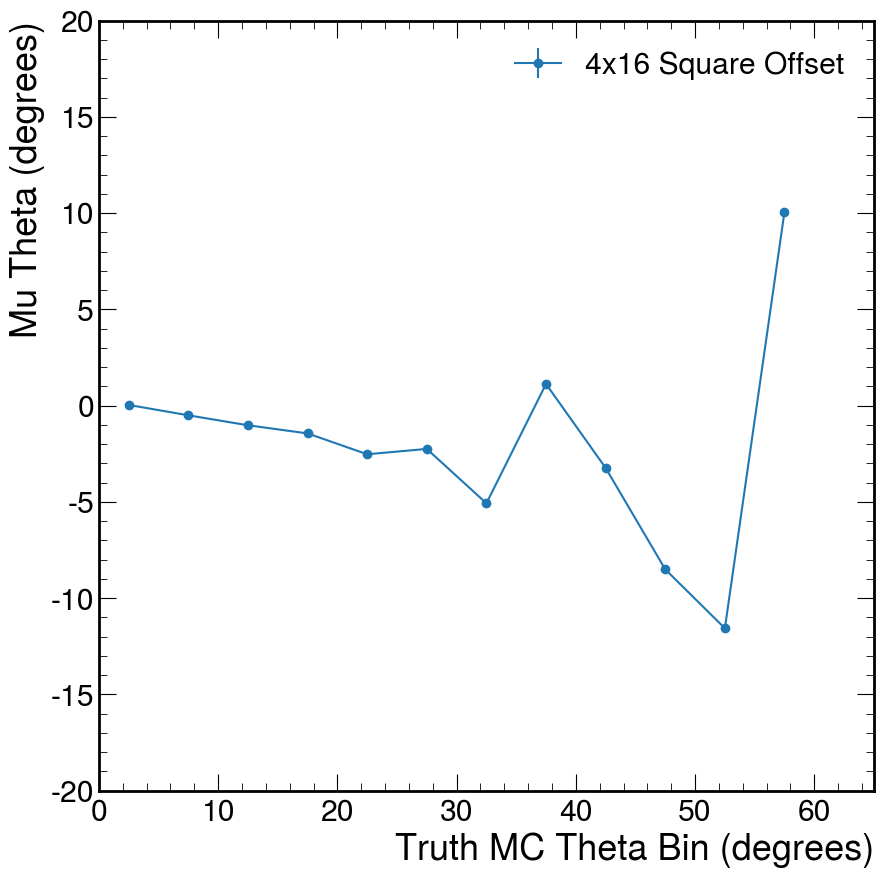

In [11]:
plt.errorbar(bin,mea,yerr=np.abs(mea_e),fmt='-o',label='4x16 Square Offset')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Mu Theta (degrees)')
plt.xlim(0,65)
plt.ylim(-20,20)
plt.legend()

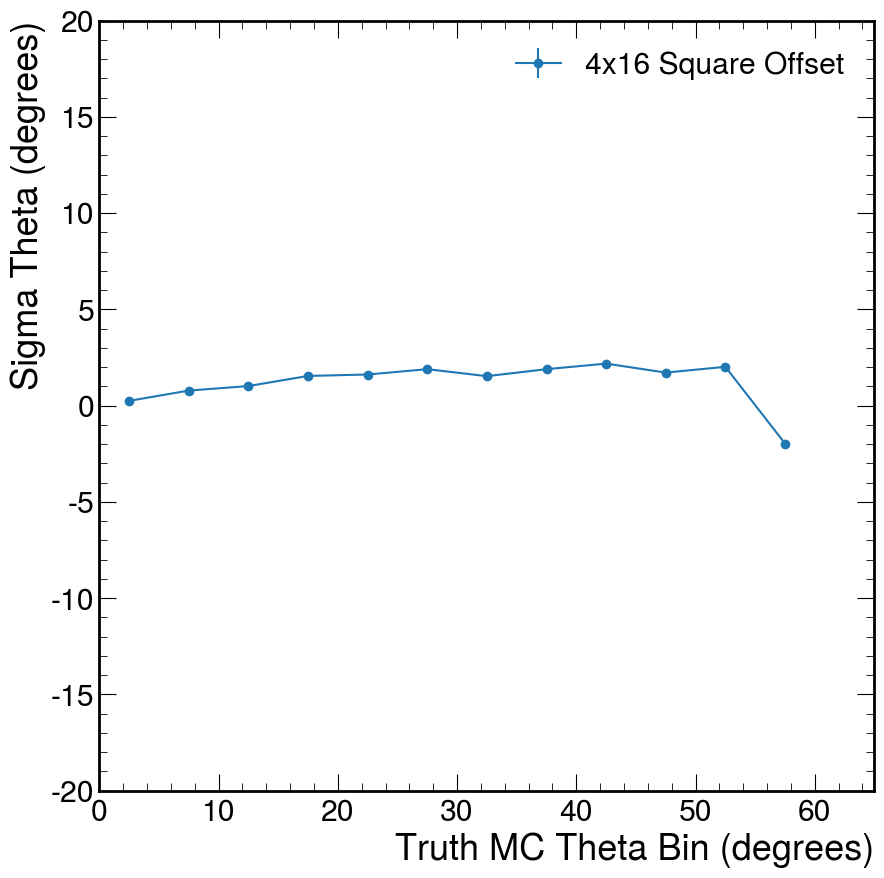

In [12]:
plt.errorbar(bin,sig,yerr=np.abs(sig_e),fmt='-o',label='4x16 Square Offset')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Sigma Theta (degrees)')
plt.xlim(0,65)
plt.ylim(-20,20)
plt.legend()

In [13]:
lengths = np.array([len(cells) if len(cells)>=2 else False for cells in arrays['muon'][f"HcalFarForwardZDCHits.energy"][data_MIP_cut]])[np.array(data_cell_cut)]
lengthss = np.array([len(cells) for cells in arrays['muon'][f"HcalFarForwardZDCHits.energy"]])

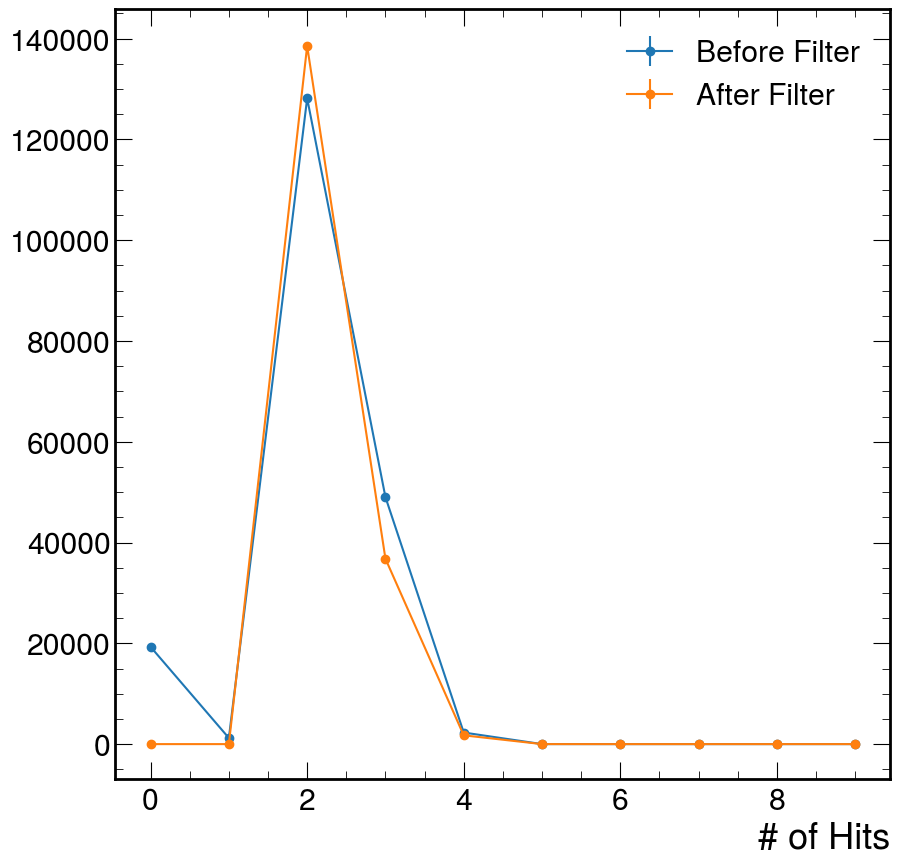

In [14]:
y,x = np.histogram(lengthss,bins=np.linspace(0,10,11))
bc=(x[1:]+x[:-1])/2-0.5
plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'Before Filter')

y,x = np.histogram(lengths,bins=np.linspace(0,10,11))
bc=(x[1:]+x[:-1])/2-0.5
plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'After Filter')
plt.xlabel('# of Hits')
plt.legend()

Text(0, 1, '# of Hits')

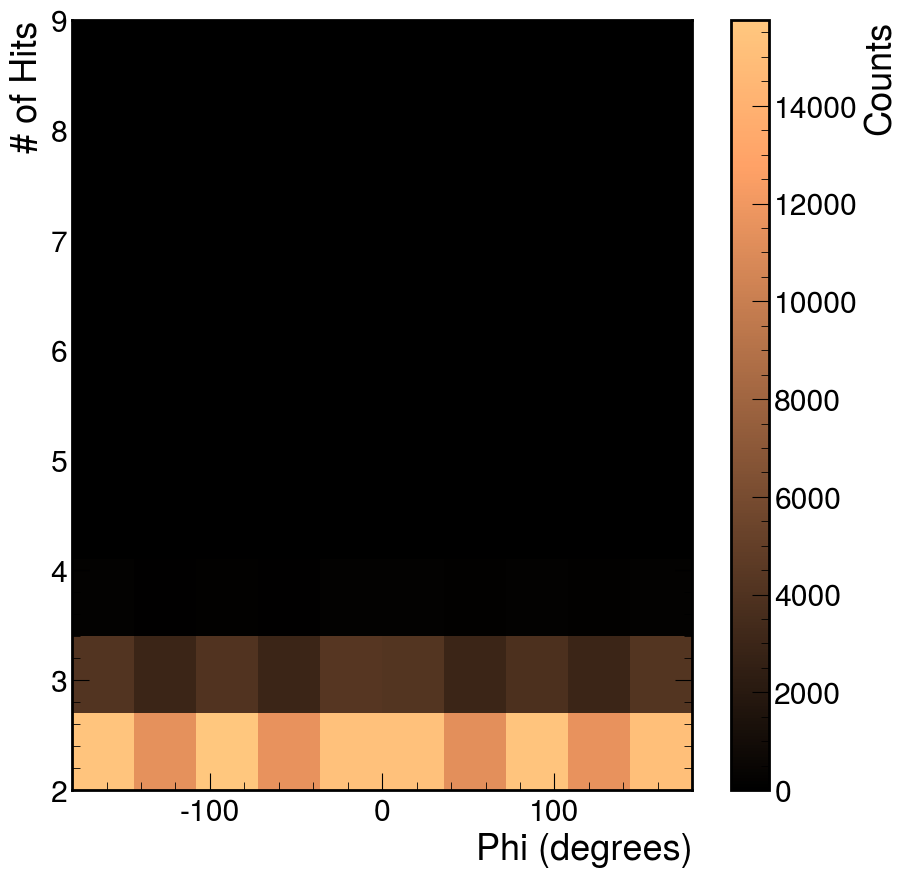

In [15]:
T, xedges, yedges = np.histogram2d(np.asarray(ak.flatten(mc_phi)),np.array(lengths))
plt.imshow(np.asarray(T).T, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           cmap='copper', aspect='auto')
plt.colorbar(label='Counts')
plt.xlabel("Phi (degrees)")
plt.ylabel("# of Hits")

Text(0, 1, '# of Hits')

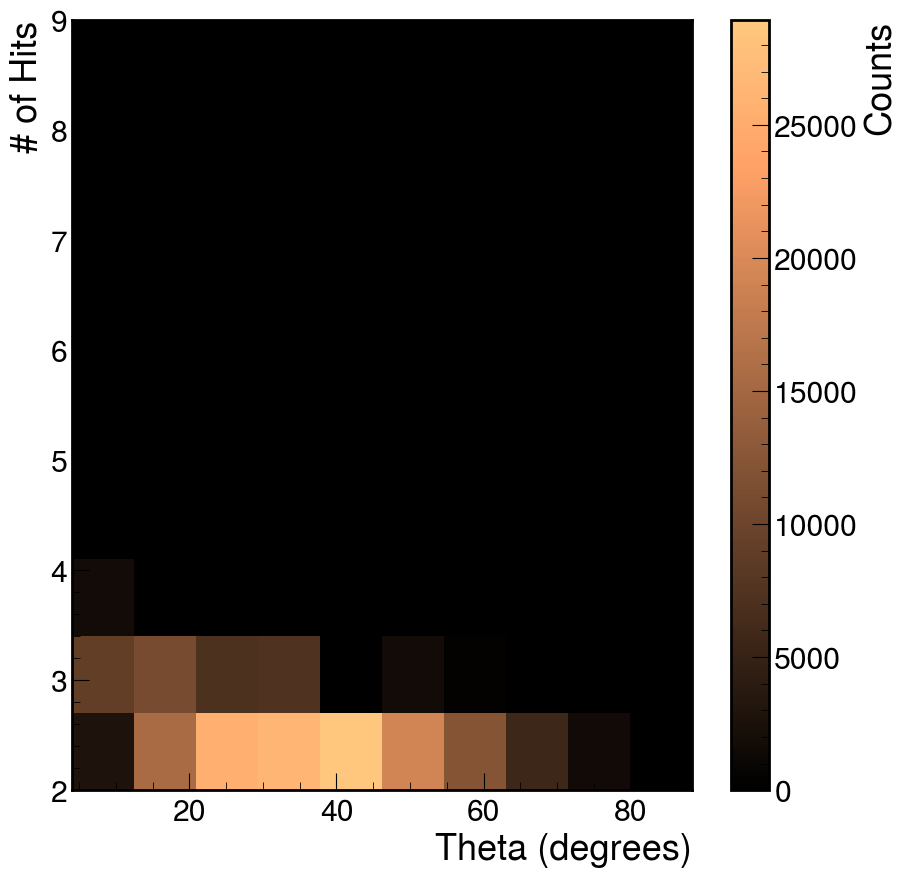

In [16]:
H, xedges, yedges = np.histogram2d(np.asarray(ak.flatten(mc_theta)),np.array(lengths))
plt.imshow(np.asarray(H).T, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
           cmap='copper', aspect='auto')
plt.colorbar(label='Counts')
plt.xlabel("Theta (degrees)")
plt.ylabel("# of Hits")

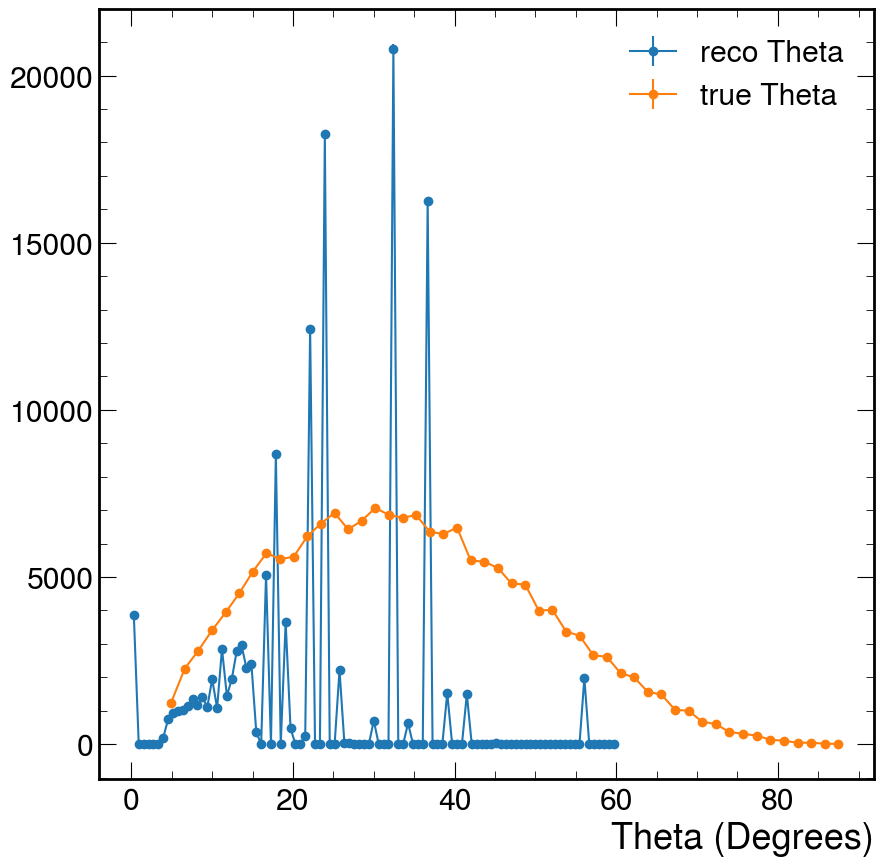

In [34]:
y,x = np.histogram(np.mod(__reco_data_angle[:,0], 360),bins=np.linspace(0,60.0, 100))
bc=(x[1:]+x[:-1])/2
plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'reco Theta')
y,x = np.histogram(np.mod(mc_theta, 360),bins=50)
bc=(x[1:]+x[:-1])/2
plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'true Theta')
plt.xlabel('Theta (Degrees)')
plt.legend()

In [29]:
data_energy_sum = [sum(cells)*1000 if len(cells)>=2 else False for cells in arrays['muon'][f"HcalFarForwardZDCHits.energy"][data_MIP_cut]]

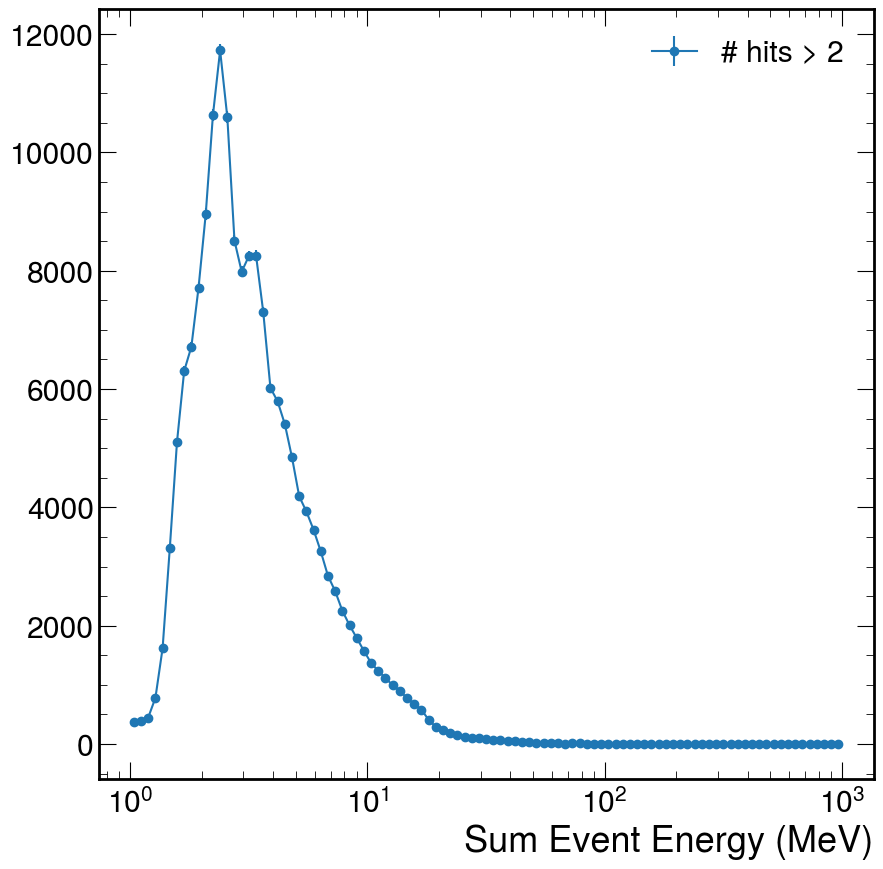

In [30]:
y,x = np.histogram(np.array(data_energy_sum)[np.array(data_cell_cut)],bins=np.logspace(0,3,100))
bc=(x[1:]+x[:-1])/2
plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'# hits > 2')
plt.xlabel('Sum Event Energy (MeV)')
plt.xscale('log')
#plt.yscale('log')
plt.legend()

Text(0, 1, 'Sum Event Energy (MeV)')

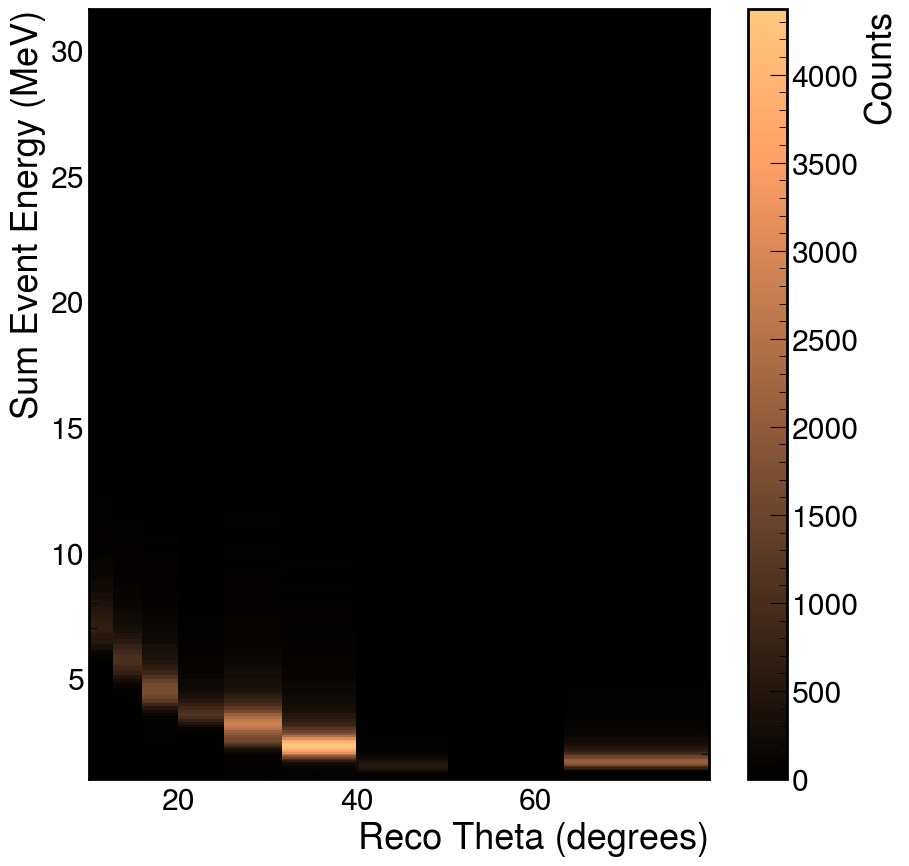

In [31]:
H, xedges, yedges = np.histogram2d(
    reco_data_angle[:,0],
    np.array(data_energy_sum)[np.array(data_cell_cut)],
    bins=(np.logspace(1,1.9,10), np.logspace(0, 1.5, 100))
)

X, Y = np.meshgrid(xedges, yedges)

plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label='Counts')
plt.xlabel("Reco Theta (degrees)")
plt.ylabel('Sum Event Energy (MeV)')
#plt.yscale('log')


Fit parameters: A=17.524, k=0.092, C=1.608


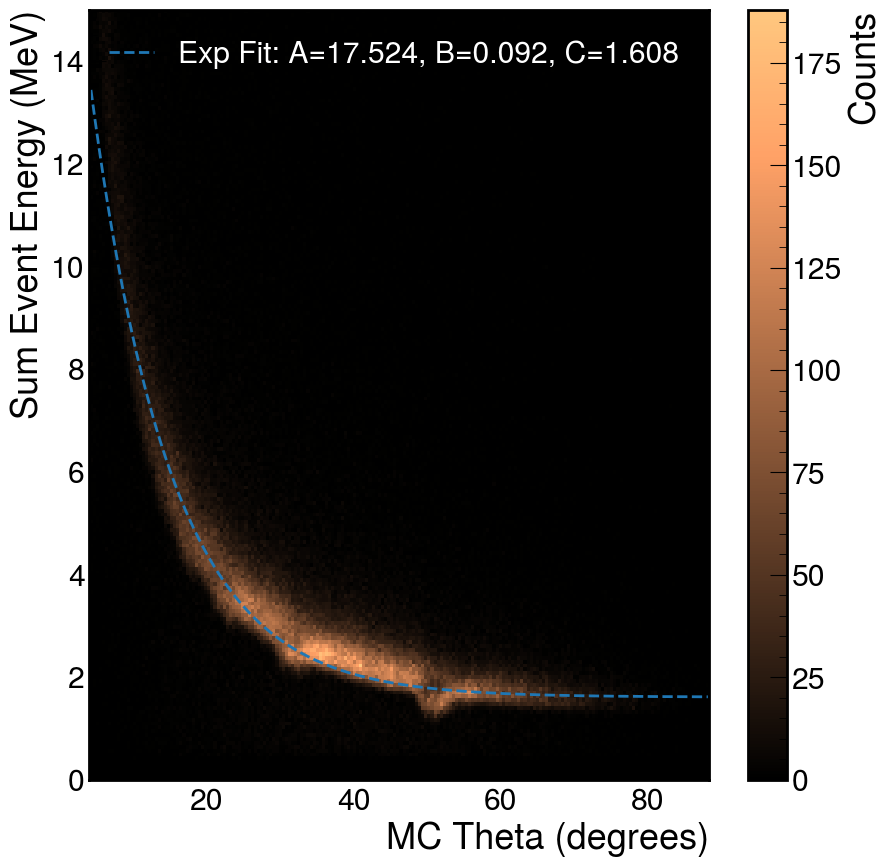

In [32]:
H, xedges, yedges = np.histogram2d(
    np.asarray(ak.flatten(mc_theta)),
    np.array(data_energy_sum)[np.array(data_cell_cut)],
    bins=(200, np.linspace(0,15,200))
)

X, Y = np.meshgrid(xedges, yedges)

plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label='Counts')
plt.xlabel("MC Theta (degrees)")
plt.ylabel('Sum Event Energy (MeV)')
#plt.yscale('log')


peak_indices = np.argmax(H, axis=1)
theta_centers = 0.5 * (xedges[:-1] + xedges[1:])
energy_centers = 0.5 * (yedges[:-1] + yedges[1:])
E_peaks = energy_centers[peak_indices]
def exp_decay(theta, A, k, C):
    return A * np.exp(-k * theta) + C
# Remove NaNs or weird edges
mask = np.isfinite(E_peaks)
theta_fit = theta_centers[mask]
E_fit = E_peaks[mask]

popt, pcov = curve_fit(exp_decay, theta_fit, E_fit, p0=(10, 0.05, 0))
A, k, C = popt
print("Fit parameters: A=%.3f, k=%.3f, C=%.3f" % (A, k, C))
theta_smooth = np.linspace(theta_fit.min(), theta_fit.max(), 300)
plt.plot(theta_smooth, exp_decay(theta_smooth, *popt), '--', lw=2, label="Exp Fit: A=%.3f, B=%.3f, C=%.3f" % (A, k, C))
legend = plt.legend(facecolor="black", edgecolor="white")
for text in legend.get_texts():
    text.set_color("white")

/tmp/ipykernel_2463636/2069813570.py:2: RuntimeWarning: invalid value encountered in log
  return -(1.0 / k) * np.log((E - C) / A)


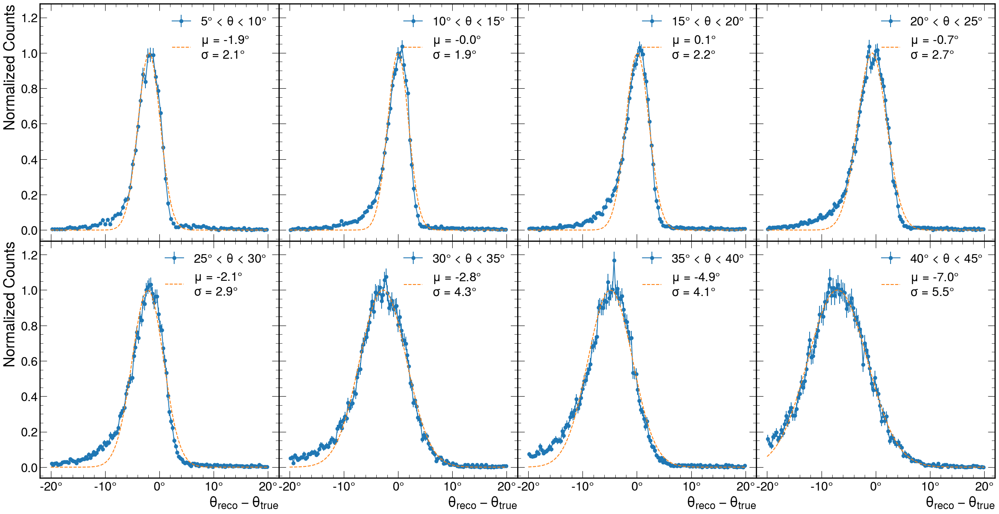

In [33]:
def theta_from_energy(E, A, k, C):
    return -(1.0 / k) * np.log((E - C) / A)
binsize = 5
bin_ = []
sig_ = []
mea_ = []
sig_e_ = []
mea_e_ = []
max_bin = 55
fig, ax = plt.subplots(2,4,figsize=(30,15),sharex=True,sharey=True)
fig.subplots_adjust(wspace=0,hspace=0)
#plt.suptitle('Square Offset 4x16 Detector: Energy Fitted Method',fontsize=60)
reco_energy_angle = theta_from_energy(np.array(data_energy_sum)[np.array(data_cell_cut)],*popt)
for i in range(8):
    plt.sca(ax[i//4,i%4])
    cut = (((i+1) * binsize <= ak.flatten(mc_theta)) & (ak.flatten(mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(reco_energy_angle[cut]-mc_theta[cut],bins=int(np.sqrt(len(mc_theta[cut]))),range=(-20,20))
    bc=(x[1:]+x[:-1])/2
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin_.append((i+0.5) * binsize)
        sig_.append(coeff[2])
        mea_.append(coeff[1])
        sig_e_.append(covar[2][2])
        mea_e_.append(covar[1][1])
        plt.errorbar(bc,y/coeff[0],yerr=np.sqrt(y)/coeff[0], fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$')
        plt.errorbar(np.linspace(-20,20,100),gaus(np.linspace(-20,20,100),*coeff)/coeff[0],fmt='--',label=rf'$\mu$ = {coeff[1]:.1f}$\degree$'+'\n'+rf'$\sigma$ = {abs(coeff[2]):.1f}$\degree$')
    except: continue
    plt.xlabel(r'$\theta_{reco} - \theta_{true}$')
    plt.legend(loc = 'upper right')

ax[0,0].set_ylabel('Normalized Counts')
ax[1,0].set_ylabel('Normalized Counts')
import matplotlib.ticker as mticker
def degree_formatter(x, pos):
    return rf"{int(x)}$\degree$" 
for axi in ax.flat:
    axi.xaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))

/tmp/ipykernel_2459031/2798990699.py:2: RuntimeWarning: invalid value encountered in log
  return -(1.0 / k) * np.log((E - C) / A)


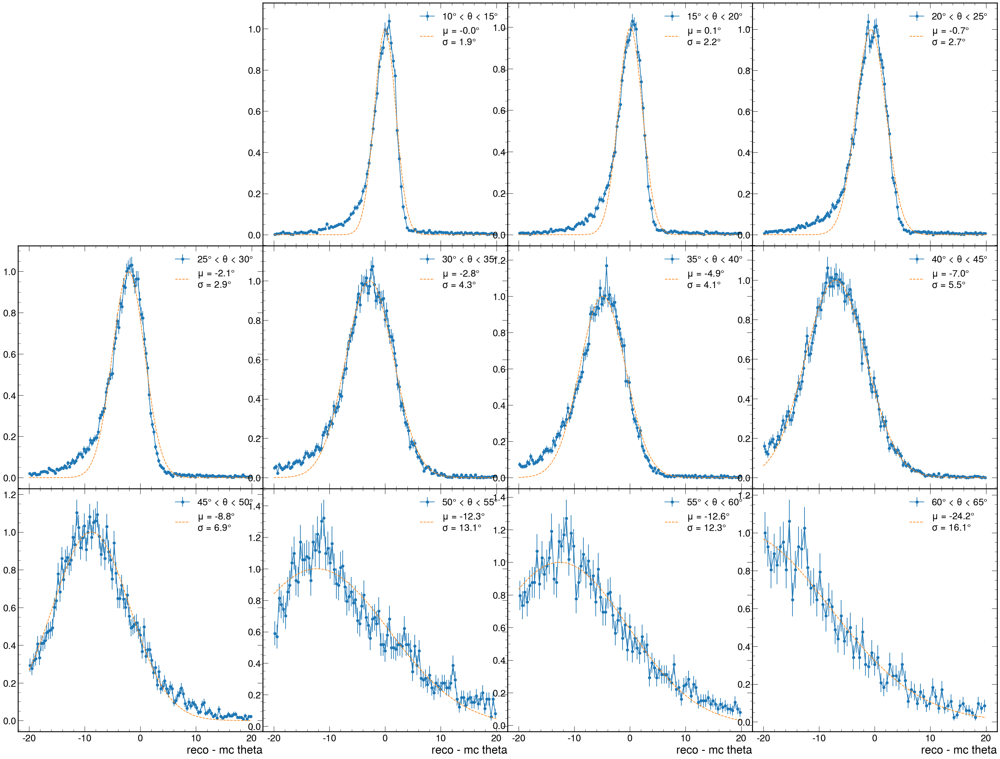

In [23]:
def theta_from_energy(E, A, k, C):
    return -(1.0 / k) * np.log((E - C) / A)
binsize = 5
bin_ = []
sig_ = []
mea_ = []
sig_e_ = []
mea_e_ = []
max_bin = 60
fig, ax = plt.subplots(3,int(max_bin/binsize/3),figsize=(10*int(max_bin/binsize/3),30))
fig.subplots_adjust(wspace=0,hspace=0)
#plt.suptitle('Square Offset 4x16 Detector: Energy Fitted Method',fontsize=60)
reco_energy_angle = theta_from_energy(np.array(data_energy_sum)[np.array(data_cell_cut)],*popt)
for i in range(int(max_bin/binsize)):
    plt.sca(ax[i//int(max_bin/binsize/3),i%int(max_bin/binsize/3)])
    cut = (((i+1) * binsize <= ak.flatten(mc_theta)) & (ak.flatten(mc_theta) < ((i+1) + 1) * binsize))
    y,x = np.histogram(reco_energy_angle[cut]-mc_theta[cut],bins=int(np.sqrt(len(mc_theta[cut]))),range=(-20,20))
    bc=(x[1:]+x[:-1])/2
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(50000,-5,20))
        bin_.append((i+0.5) * binsize)
        sig_.append(coeff[2])
        mea_.append(coeff[1])
        sig_e_.append(covar[2][2])
        mea_e_.append(covar[1][1])
        plt.errorbar(bc,y/coeff[0],yerr=np.sqrt(y)/coeff[0], fmt='-o',label=rf'{(i+1) * binsize}$\degree$ < $\theta$ < {((i+1) + 1) * binsize}$\degree$')
        plt.errorbar(np.linspace(-20,20,100),gaus(np.linspace(-20,20,100),*coeff)/coeff[0],fmt='--',label=rf'$\mu$ = {coeff[1]:.1f}$\degree$'+'\n'+rf'$\sigma$ = {abs(coeff[2]):.1f}$\degree$')
    except: continue
    plt.xlabel('reco - mc theta')
    plt.legend()
fig.delaxes(ax[0,0])

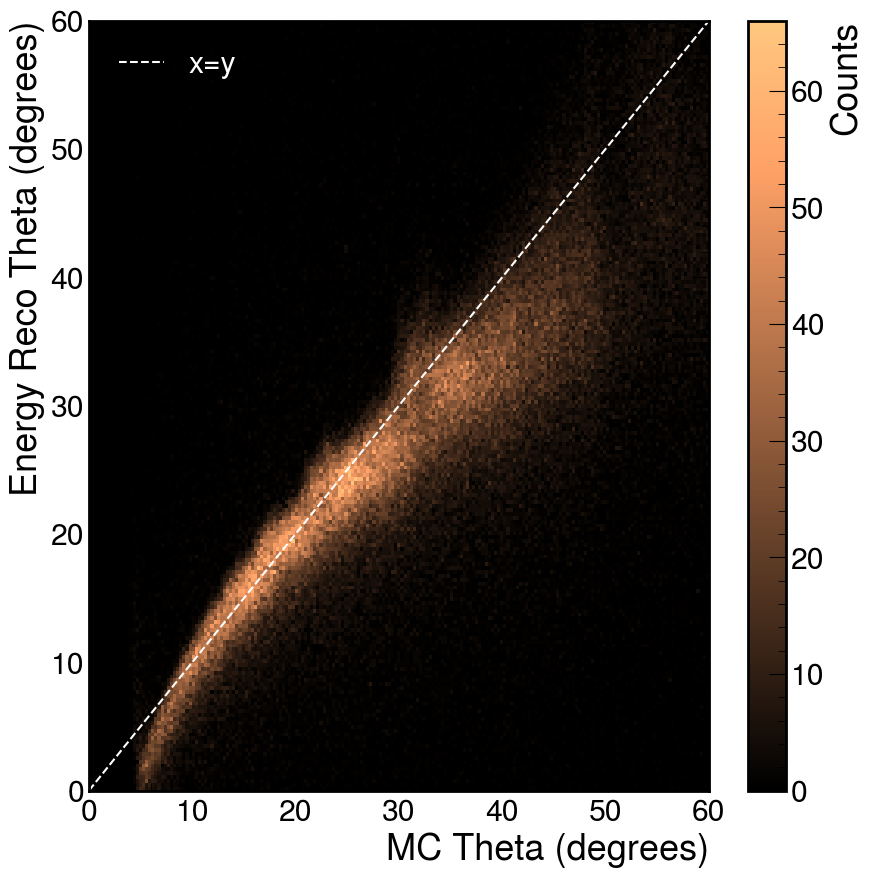

In [24]:
H, xedges, yedges = np.histogram2d(
    np.asarray(ak.flatten(mc_theta)),
    reco_energy_angle,
    bins=(np.linspace(0,60,200), np.linspace(0,60,200))
)
X, Y = np.meshgrid(xedges, yedges)
plt.errorbar([0,60],[0,60],fmt='--',c='white',label='x=y')
plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label='Counts')
plt.xlabel("MC Theta (degrees)")
plt.ylabel('Energy Reco Theta (degrees)')
legend = plt.legend(facecolor="black", edgecolor="white")
for text in legend.get_texts():
    text.set_color("white")

Text(0.5, 1.0, 'Energy Fitted Method')

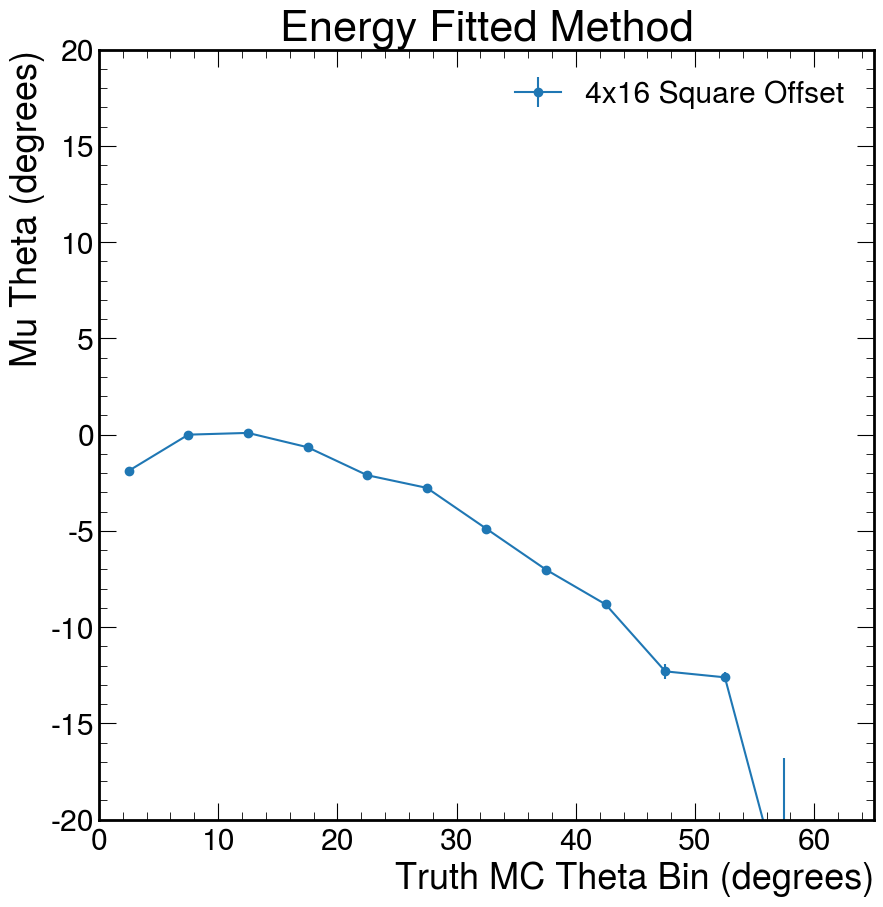

In [25]:
plt.errorbar(bin_,mea_,yerr=np.abs(mea_e_),fmt='-o',label='4x16 Square Offset')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Mu Theta (degrees)')
plt.xlim(0,65)
plt.ylim(-20,20)
plt.legend()
plt.title('Energy Fitted Method')

Text(0.5, 1.0, 'Energy Fitted Method')

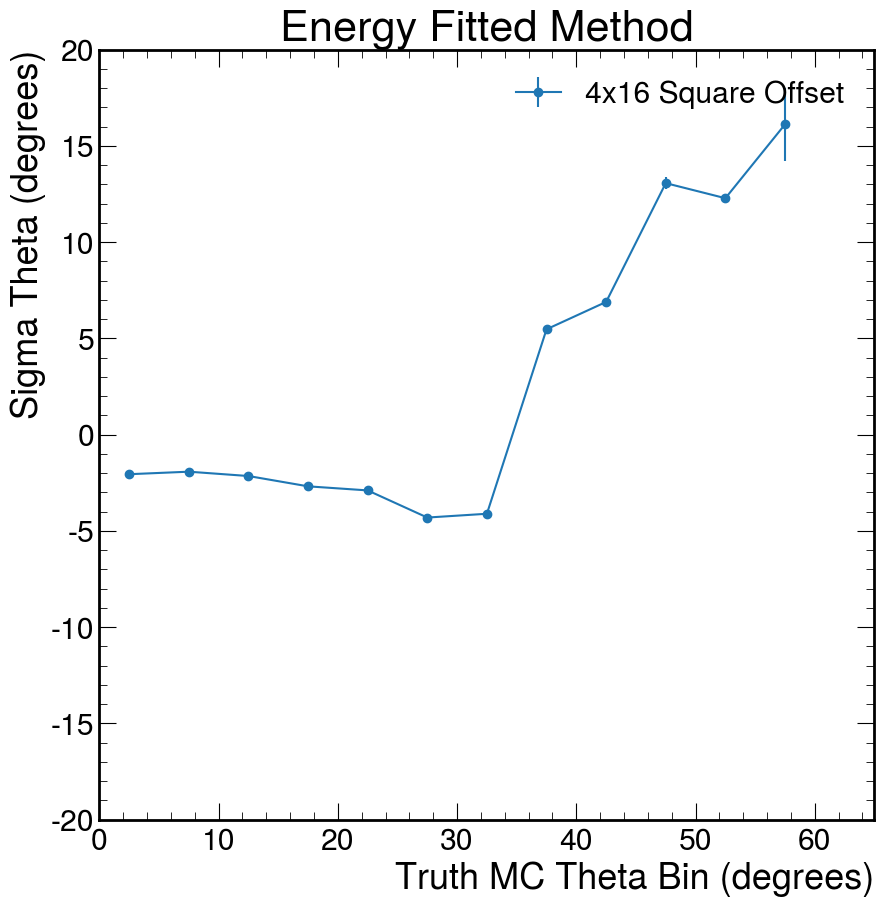

In [26]:
plt.errorbar(bin_,sig_,yerr=np.abs(sig_e_),fmt='-o',label='4x16 Square Offset')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Sigma Theta (degrees)')
plt.xlim(0,65)
plt.ylim(-20,20)
plt.legend()
plt.title('Energy Fitted Method')

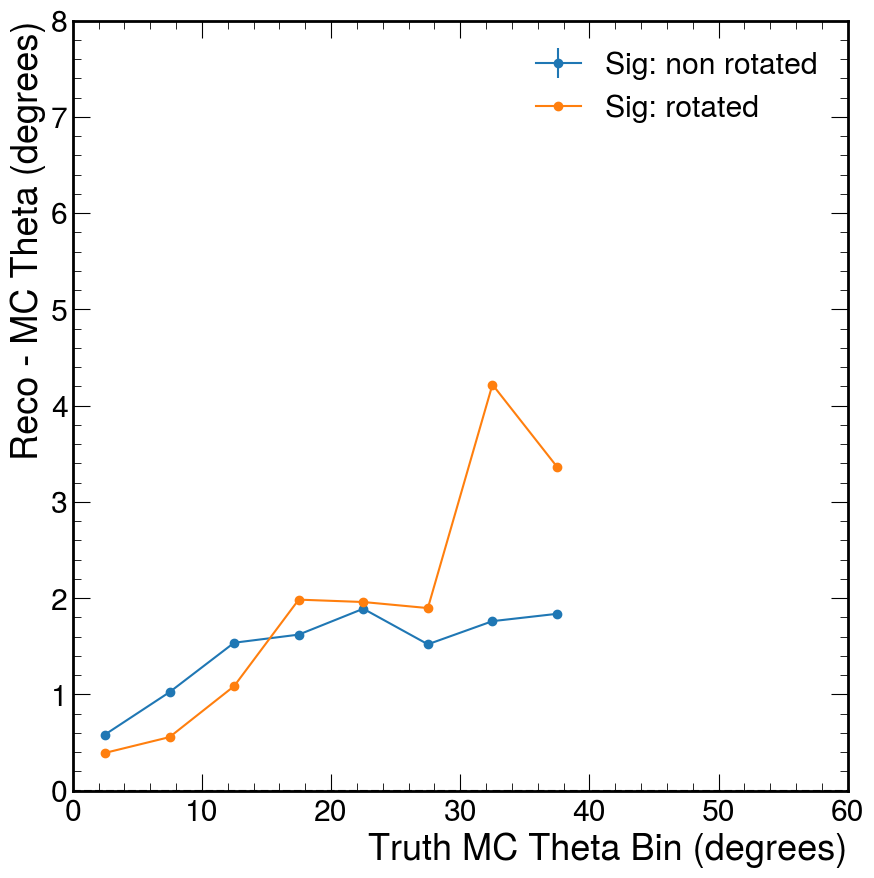

In [46]:
plt.errorbar(bin,np.abs(sig),yerr=np.abs(sig_e),fmt='-o',label='Sig: non rotated')
plt.errorbar(bin_2x8,np.abs(sig_2x8),fmt='-o',label='Sig: rotated')
plt.axhline(0,linestyle='dashed',c='black')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Reco - MC Theta (degrees)')
plt.xlim(0,60)
plt.ylim(bottom=0,top=8)
plt.legend()
#plt.title(f'Threshold: 0.8*MIP; {0.8*MIP*1000:.2f} MeV')

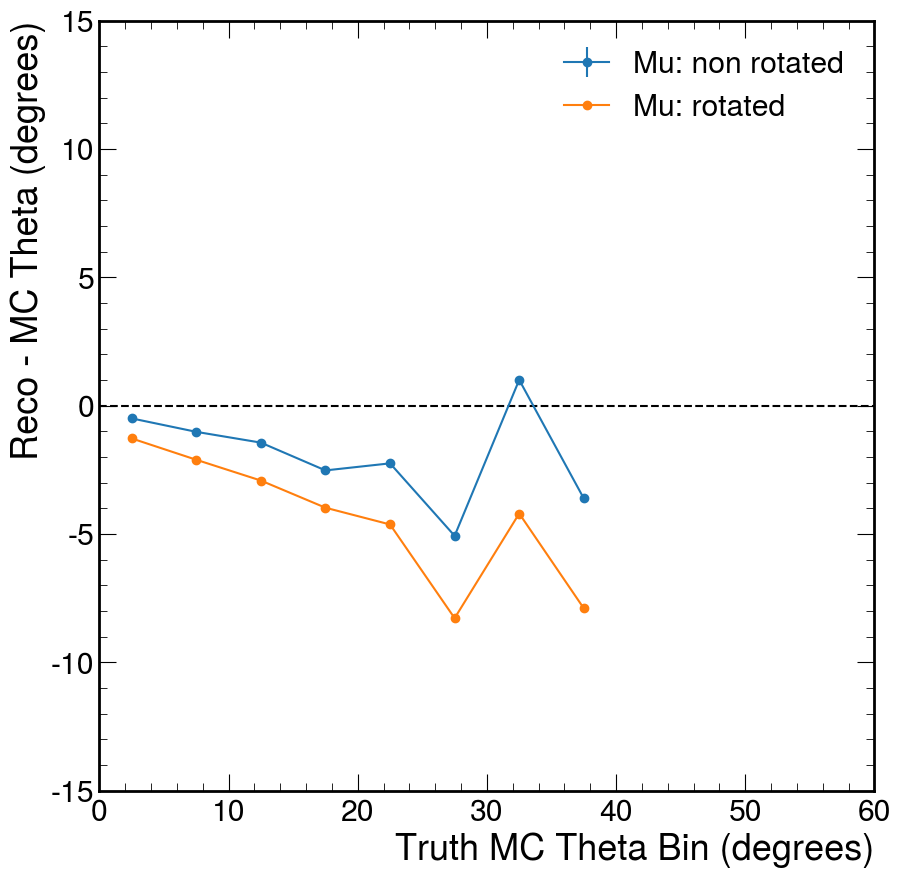

In [45]:
plt.errorbar(bin,mea,yerr=np.abs(mea_e),fmt='-o',label='Mu: non rotated')
plt.errorbar(bin_2x8,mea_2x8,fmt='-o',label='Mu: rotated')
plt.axhline(0,linestyle='dashed',c='black')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Reco - MC Theta (degrees)')
plt.xlim(0,60)
plt.ylim(bottom=-15,top=15)
plt.legend()
#plt.title(f'Threshold: 0.8*MIP; {0.8*MIP*1000:.2f} MeV')

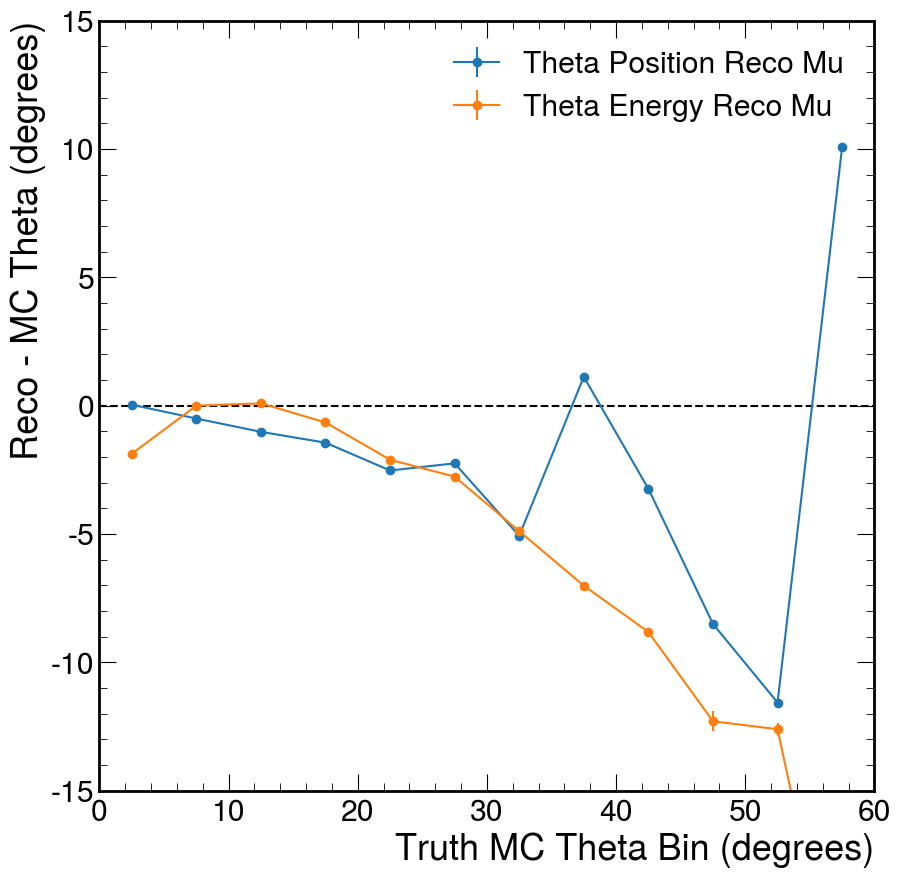

In [29]:
plt.errorbar(bin,mea,yerr=np.abs(mea_e),fmt='-o',label='Theta Position Reco Mu')
plt.errorbar(bin_,mea_,yerr=np.abs(mea_e_),fmt='-o',label='Theta Energy Reco Mu')
plt.axhline(0,linestyle='dashed',c='black')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Reco - MC Theta (degrees)')
plt.xlim(0,60)
plt.ylim(bottom=-15,top=15)
plt.legend()
#plt.title(f'Threshold: 0.8*MIP; {0.8*MIP*1000:.2f} MeV')

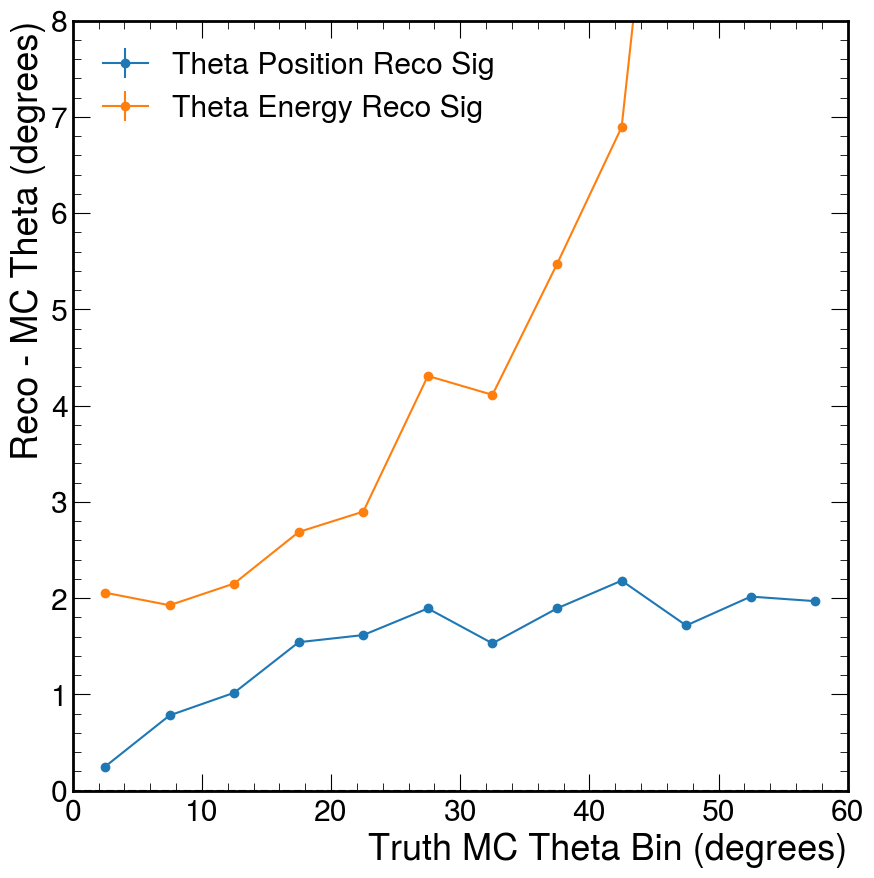

In [30]:
plt.errorbar(bin,np.abs(sig),yerr=np.abs(sig_e),fmt='-o',label='Theta Position Reco Sig')
plt.errorbar(bin_,np.abs(sig_),yerr=np.abs(sig_e_),fmt='-o',label='Theta Energy Reco Sig')
plt.axhline(0,linestyle='dashed',c='black')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Reco - MC Theta (degrees)')
plt.xlim(0,60)
plt.ylim(bottom=0,top=8)
plt.legend()
#plt.title(f'Threshold: 0.8*MIP; {0.8*MIP*1000:.2f} MeV')

Text(0, 1, 'Sum Event Energy (MeV)')

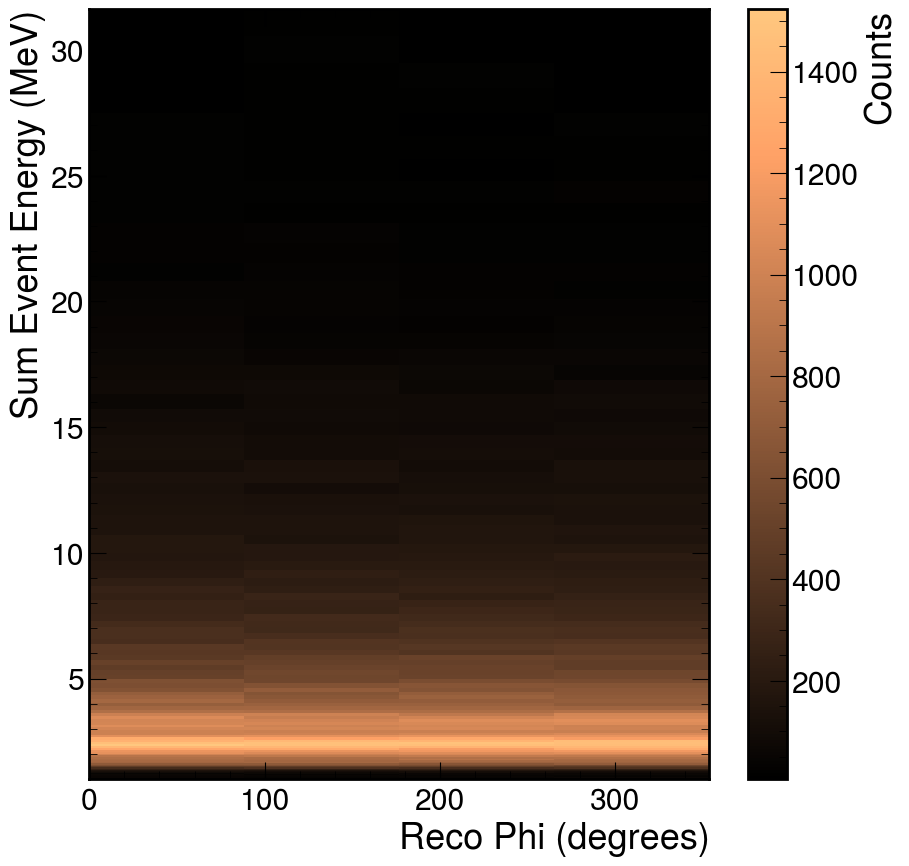

In [31]:
H, xedges, yedges = np.histogram2d(
    np.mod(np.asarray(reco_data_angle[:,1]), 360),
    np.array(data_energy_sum)[np.array(data_cell_cut)],
    bins=(4, np.logspace(0, 1.5, 100))
)

X, Y = np.meshgrid(xedges, yedges)

plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label='Counts')
plt.xlabel("Reco Phi (degrees)")
plt.ylabel('Sum Event Energy (MeV)')
#plt.yscale('log')


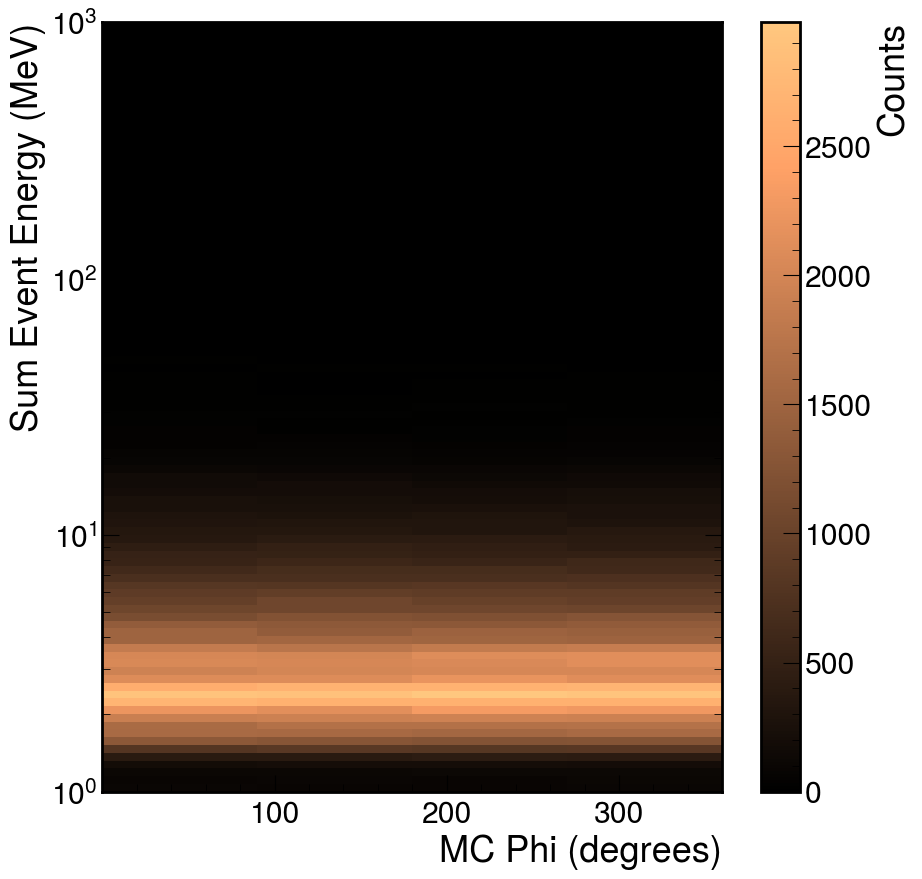

In [32]:
H, xedges, yedges = np.histogram2d(
    np.mod(np.asarray(ak.flatten(mc_phi)), 360),
    np.array(data_energy_sum)[np.array(data_cell_cut)],
    bins=(4, np.logspace(0, 3, 100))
)

X, Y = np.meshgrid(xedges, yedges)

plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label="Counts")

plt.xlabel("MC Phi (degrees)")
plt.ylabel('Sum Event Energy (MeV)')
plt.yscale("log")   


In [33]:
cell_hits = arrays['muon']["HcalFarForwardZDCHitsContributions.energy"][np.array(data_cell_cut)]

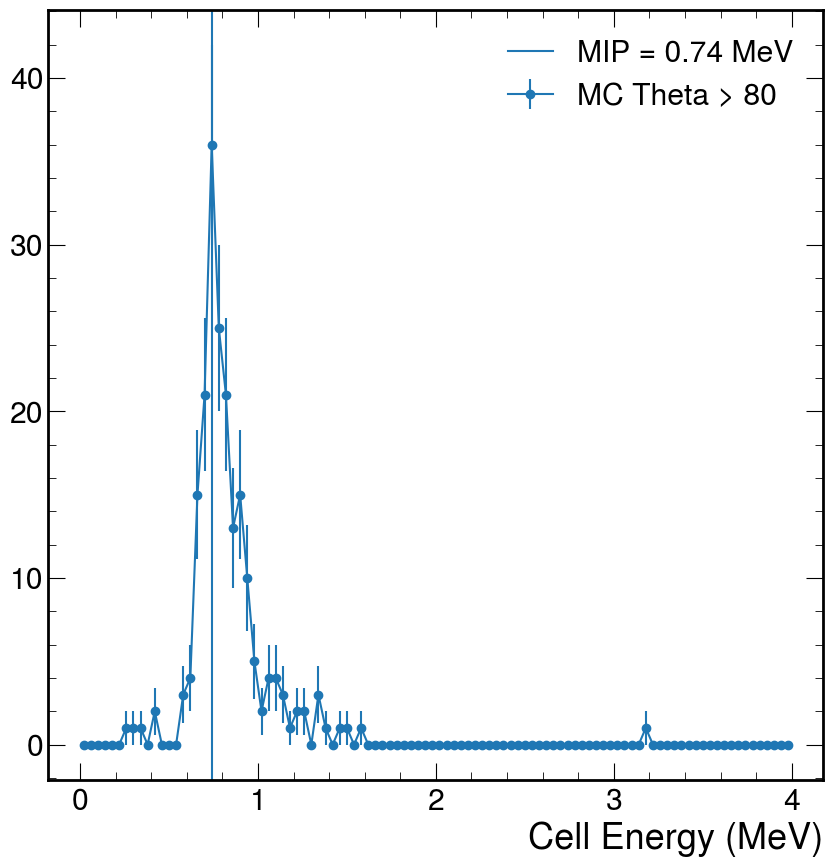

In [34]:
y,x=np.histogram(ak.flatten(cell_hits[mc_theta>80]), bins=100, range=(0, 0.004))
bc=(x[1:]+x[:-1])/2
MIP=list(bc[y==max(y)])[0] 
plt.errorbar(np.array(bc)*1000,np.array(y),yerr=np.sqrt(y),fmt='-o',label='MC Theta > 80')
plt.axvline(MIP*1000,label=f'MIP = {MIP*1000:.2f} MeV')
plt.xlabel('Cell Energy (MeV)')
plt.legend()

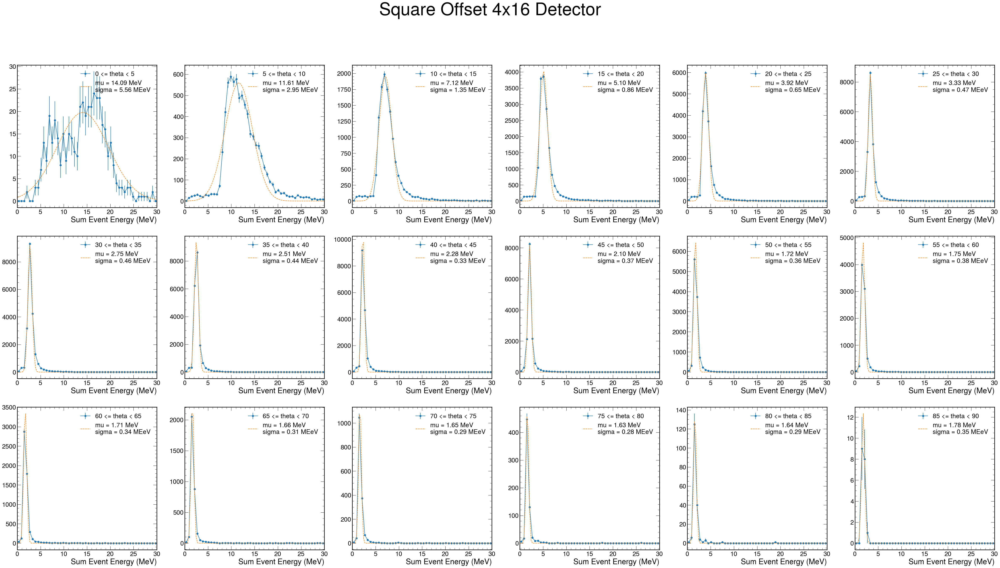

In [35]:
binsize = 5
bin = []
sig = []
mea = []
sig_e = []
mea_e = []
fig, ax = plt.subplots(3,int(90/binsize/3),figsize=(10*int(90/binsize/3),30))
plt.suptitle('Square Offset 4x16 Detector',fontsize=60)
for i in range(int(90/binsize)):
    plt.sca(ax[i//int(90/binsize/3),i%int(90/binsize/3)])
    cut = ((i * binsize <= ak.flatten(mc_theta)) & (ak.flatten(mc_theta) < (i + 1) * binsize))
    y,x = np.histogram(np.array(data_energy_sum)[np.array(data_cell_cut)][cut],
                       bins=50,
                       range=(0,30)
                      )
    bc=(x[1:]+x[:-1])/2
    plt.errorbar(bc,y,yerr=np.sqrt(y), fmt='-o',label=f'{i * binsize} <= theta < {(i + 1) * binsize}')
    try:
        coeff, covar = curve_fit(gaus,np.asarray(bc),np.asarray(y),p0=(5000,5,20))
        bin.append((i+0.5) * binsize)
        sig.append(coeff[2])
        mea.append(coeff[1])
        sig_e.append(covar[2][2])
        mea_e.append(covar[1][1])
        #plt.axvline(coeff[1])
        plt.errorbar(np.linspace(0,30,100),gaus(np.linspace(0,30,100),*coeff),fmt='--',label=f'mu = {coeff[1]:.2f} MeV' +'\n'+f'sigma = {abs(coeff[2]):.2f} MEeV')
    except: continue
    plt.xlim(0,30)
    plt.xlabel('Sum Event Energy (MeV)')
    plt.legend()

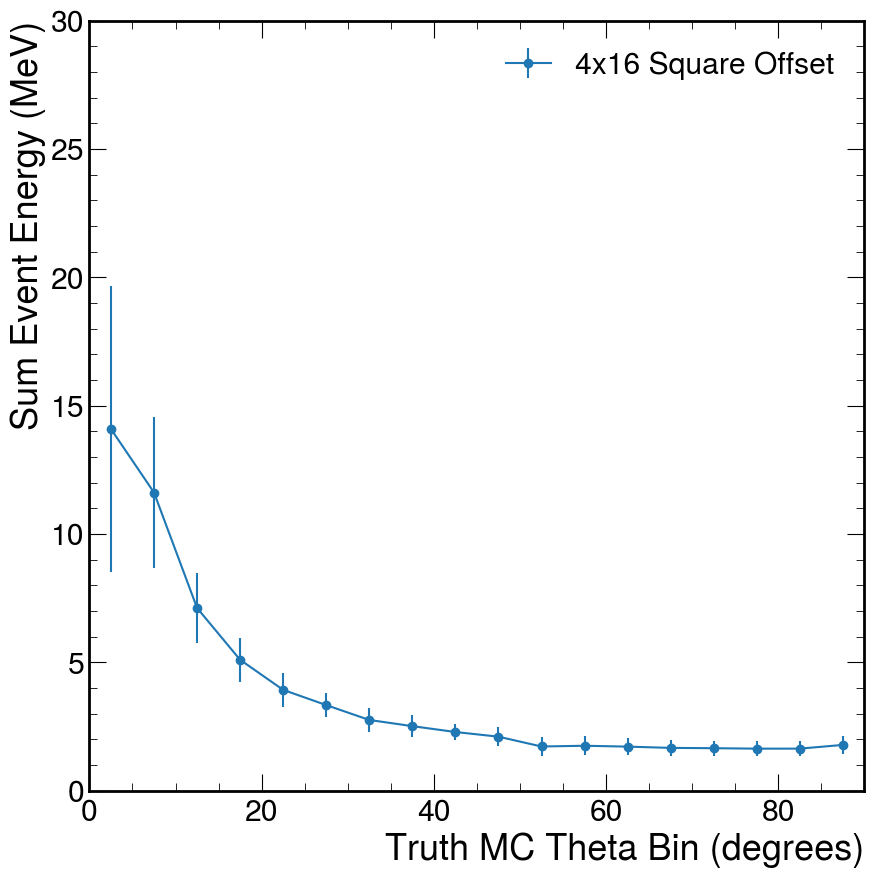

In [36]:
plt.errorbar(bin,mea,yerr=np.abs(sig),fmt='-o',label='4x16 Square Offset')
plt.xlabel('Truth MC Theta Bin (degrees)')
plt.ylabel('Sum Event Energy (MeV)')
plt.xlim(0,90)
plt.ylim(0,30)
plt.legend()

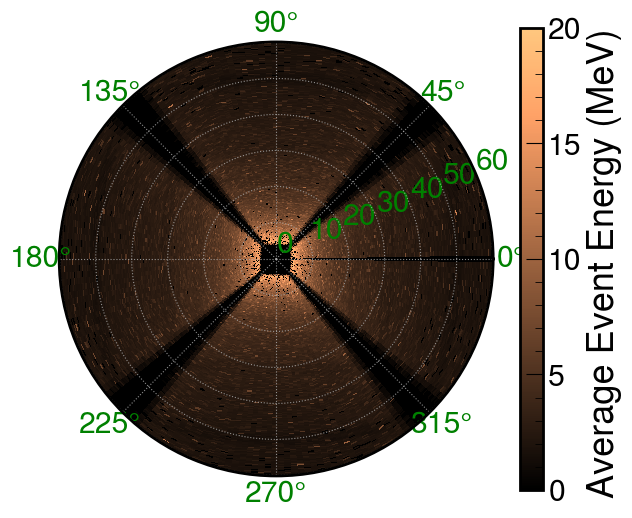

In [37]:
import numpy as np
import awkward as ak
import matplotlib.pyplot as plt

# Extract variables
phi = np.mod(np.asarray(ak.flatten(mc_phi)), 360)              # degrees
theta = np.asarray(ak.flatten(mc_theta))                       # degrees
energy = np.array(data_energy_sum)[np.array(data_cell_cut)]    # MeV

# Define bins
phi_bins = np.linspace(0, 360, 200)   # 5° bins
theta_bins = np.linspace(0, 60, 200)  # 1° bins (adjust as needed)

# Digitize to bins
phi_idx = np.digitize(phi, phi_bins) - 1
theta_idx = np.digitize(theta, theta_bins) - 1

# Initialize arrays
H_sum = np.zeros((len(theta_bins), len(phi_bins)))
H_count = np.zeros((len(theta_bins), len(phi_bins)))

# Fill sums and counts
for t, p, e in zip(theta_idx, phi_idx, energy):
    if 0 <= t < len(theta_bins) and 0 <= p < len(phi_bins) and e <= 20:
        H_sum[t, p] += e
        H_count[t, p] += 1

# Average energy map
H_avg = np.divide(H_sum, H_count, out=np.zeros_like(H_sum), where=H_count>0)
Phi, Theta = np.meshgrid(np.deg2rad(phi_bins), theta_bins)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(7,6))

c = ax.pcolormesh(Phi, Theta, H_avg, cmap="copper", shading="auto", vmin=0, vmax=20)

fig.colorbar(c, ax=ax, label="Average Event Energy (MeV)")

ax.set_theta_zero_location("E")   # 0° at top
ax.set_theta_direction(1)        # clockwise
#ax.set_title("Theta-Phi Polar Map of Avg Energy")
ax.tick_params(colors="green") 

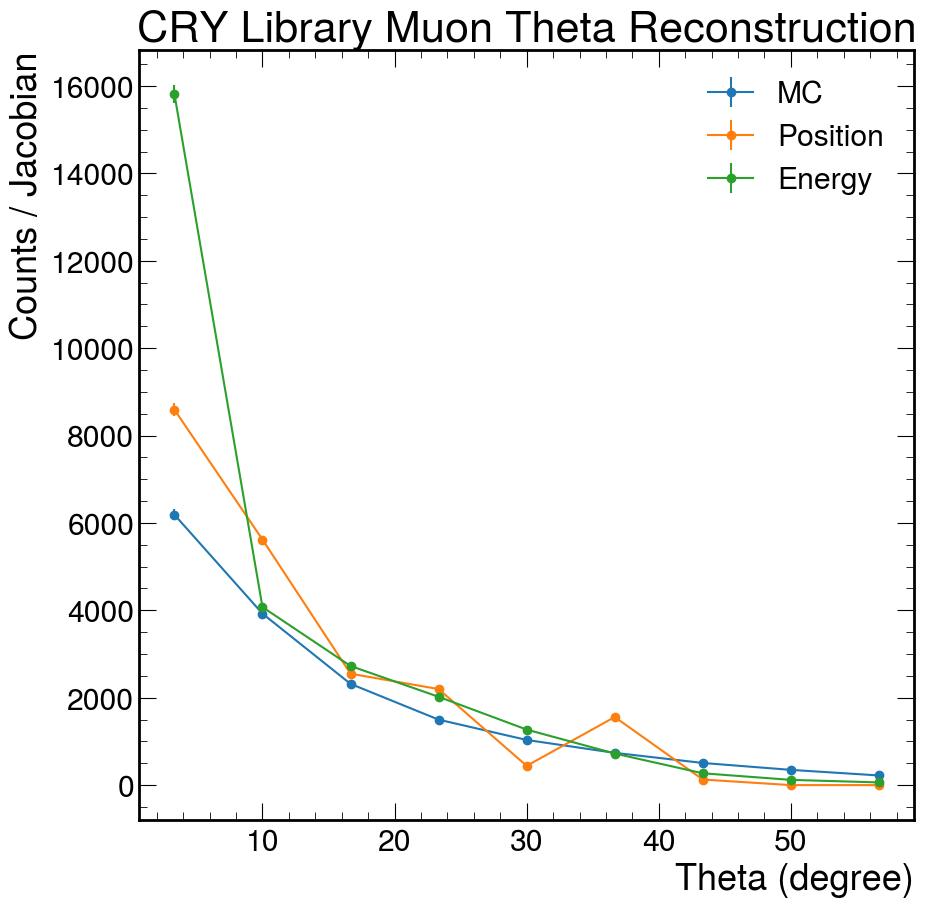

In [38]:
#plt.errorbar(np.linspace(0,60,100),np.cos(np.deg2rad(np.linspace(0,60,100)))**2/np.linspace(0,60,100),label=r'$cos^2(\theta)$',fmt='--',c='black')

bining = np.linspace(0,60,10)
y,x=np.histogram(np.array(mc_theta), bins=bining)
bc=(x[1:]+x[:-1])/2
centers_rad = np.radians(bc)
correction_factor = 2 * np.sin(centers_rad) * np.cos(centers_rad)
correction_factor = np.where(correction_factor == 0, np.nan, correction_factor)
corrected_bins = y / correction_factor / bc
corrected_errors = np.sqrt(y) / correction_factor / bc
plt.errorbar(bc, corrected_bins, yerr=corrected_errors,label=f'MC',fmt='-o')

y,x=np.histogram(reco_data_angle[:,0], bins=bining)
bc=(x[1:]+x[:-1])/2
centers_rad = np.radians(bc)
correction_factor = 2 * np.sin(centers_rad) * np.cos(centers_rad)
correction_factor = np.where(correction_factor == 0, np.nan, correction_factor)
corrected_bins = y / correction_factor / bc
corrected_errors = np.sqrt(y) / correction_factor / bc
plt.errorbar(bc, corrected_bins, yerr=corrected_errors,label=f'Position',fmt='-o')

y,x=np.histogram(reco_energy_angle, bins=bining,range=(0,90))
bc=(x[1:]+x[:-1])/2
centers_rad = np.radians(bc)
correction_factor = 2 * np.sin(centers_rad) * np.cos(centers_rad)
correction_factor = np.where(correction_factor == 0, np.nan, correction_factor)
corrected_bins = y / correction_factor / bc
corrected_errors = np.sqrt(y) / correction_factor / bc
plt.errorbar(bc, corrected_bins, yerr=corrected_errors,label=f'Energy',fmt='-o')



plt.title('CRY Library Muon Theta Reconstruction')
plt.ylabel('Counts / Jacobian')
plt.xlabel('Theta (degree)')
plt.legend()

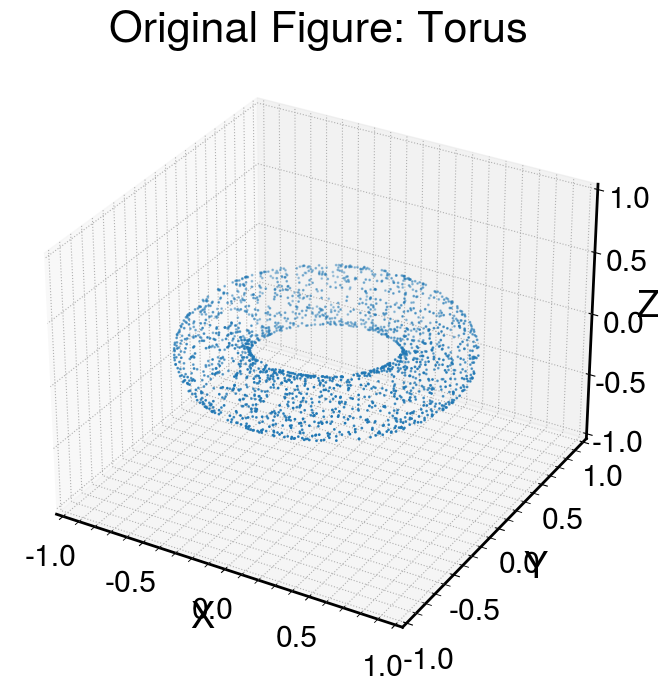

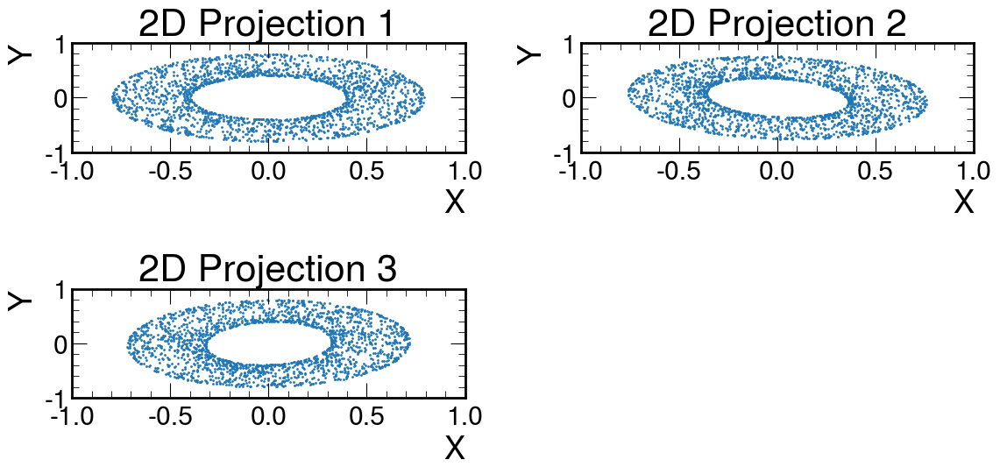

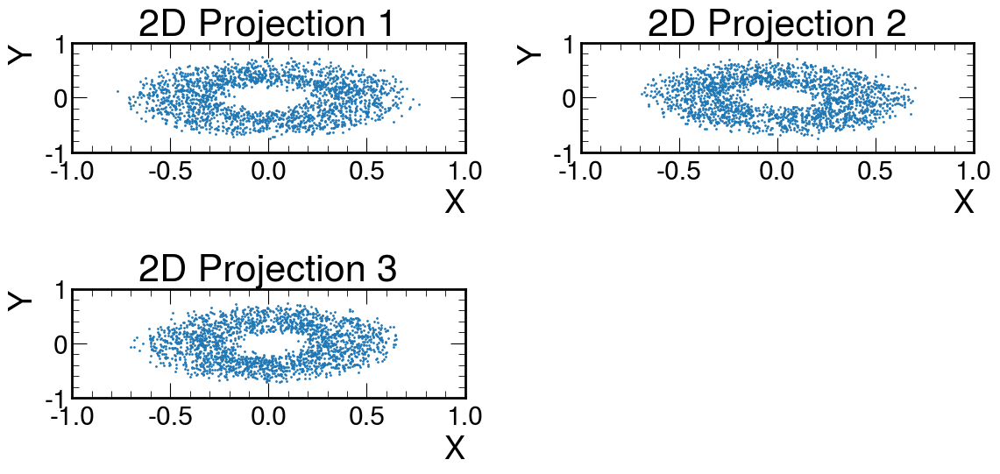

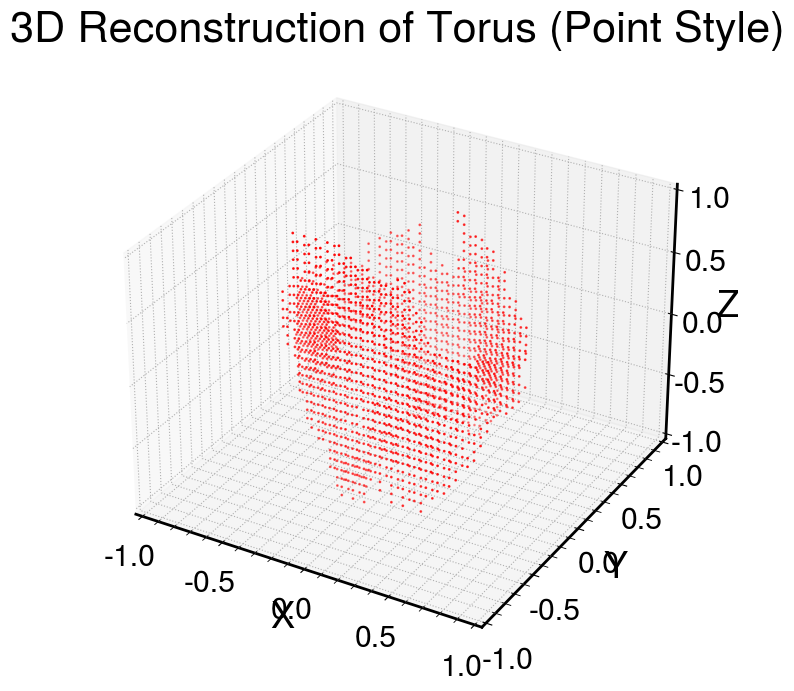

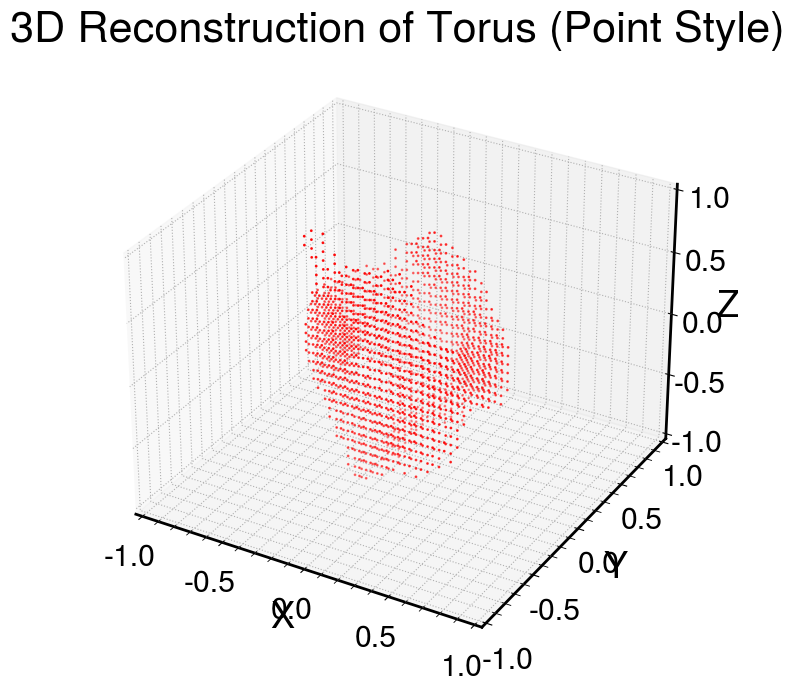

In [39]:
import numpy as np
import scipy.spatial.transform
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

# Generate points on the surface of a torus
def generate_torus(r1=0.6, r2=0.2, num_points=10000):
    """Generates points on the surface of a torus."""
    u = np.random.uniform(0, 2 * np.pi, num_points)
    v = np.random.uniform(0, 2 * np.pi, num_points)
    
    x = (r1 + r2 * np.cos(v)) * np.cos(u)
    y = (r1 + r2 * np.cos(v)) * np.sin(u)
    z = r2 * np.sin(v)
    
    return np.vstack((x, y, z)).T

# 3D to 2D projection
def project_to_2d(points, theta, phi):
    """ Projects 3D points onto a 2D plane from a given angle (theta, phi). """
    # Create rotation matrix from angles
    rotation = scipy.spatial.transform.Rotation.from_euler('ZY', [phi, theta])
    rotated_points = rotation.apply(points)
    
    # Projection in 2D simply takes the X and Y axes of the rotated system
    return rotated_points[:, :2]

# Generate 2D projections
def generate_projections(points_3d, theta_angles, phi_angles):
    projected_data = []
    for i, (theta, phi) in enumerate(zip(theta_angles, phi_angles)):
        proj_2d = project_to_2d(points_3d, theta, phi)
        projected_data.append(proj_2d)
    return projected_data

# 3D reconstruction using Backprojection
def backprojection_reconstruction(projected_data, theta_angles, phi_angles, grid_size=30):
    volume = np.zeros((grid_size, grid_size, grid_size))

    # Create a spatial coordinate grid
    x = np.linspace(-1, 1, grid_size)
    y = np.linspace(-1, 1, grid_size)
    z = np.linspace(-1, 1, grid_size)
    X, Y, Z = np.meshgrid(x, y, z, indexing='ij')

    # Iterate over each projection and accumulate into the 3D volume
    for proj_2d, (theta, phi) in zip(projected_data, zip(theta_angles, phi_angles)):
        # Rotate the volume to align with the current view
        rotation = scipy.spatial.transform.Rotation.from_euler('ZY', [-phi, -theta])
        coords = np.column_stack((X.ravel(), Y.ravel(), Z.ravel()))
        rotated_coords = rotation.apply(coords).reshape(grid_size, grid_size, grid_size, 3)

        # Map rotated coordinates to 2D for comparison with the projection
        x_proj, y_proj = rotated_coords[..., 0], rotated_coords[..., 1]

        # Accumulate density into the volume with interpolation
        for point in proj_2d:
            mask = (np.abs(x_proj - point[0]) < 0.1) & (np.abs(y_proj - point[1]) < 0.1)
            volume[mask] += 1

    # Apply Gaussian smoothing to reduce artifacts
    volume = gaussian_filter(volume, sigma=1.0)

    # Normalize the volume
    volume /= np.max(volume)
    return volume

# Visualization of the original figure (Torus)
def visualize_original_torus(points_3d_torus):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')

    ax.scatter(points_3d_torus[:, 0], points_3d_torus[:, 1], points_3d_torus[:, 2], s=1)

    # Set the axis range from -1 to 1
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)

    ax.set_title("Original Figure: Torus")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    plt.show(block=False)

# Visualization of 2D projections
def visualize_projections(projected_data):
    num_projections = len(projected_data)
    fig, axes = plt.subplots(2, int(np.ceil(num_projections / 2)), figsize=(12, 6))
    
    # Flatten axes for easier access
    axes = axes.flatten()
    
    for i, proj_2d in enumerate(projected_data):
        axes[i].scatter(proj_2d[:, 0], proj_2d[:, 1], s=1)
        axes[i].set_title(f"2D Projection {i + 1}")
        axes[i].set_xlabel("X")
        axes[i].set_ylabel("Y")
        axes[i].set_xlim(-1, 1)
        axes[i].set_ylim(-1, 1)

    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show(block=False)

# Apply smearing (blurring) to projected points
def apply_smearing(projected_data, sigma=1.0):
    """ Applies Gaussian smearing to projected points to simulate blurring. """
    smeared_data = []
    
    for proj_2d in projected_data:
        proj_2d_smeared = np.copy(proj_2d)
        
        # Apply smearing separately to X and Y coordinates
        proj_2d_smeared[:, 0] = gaussian_filter(proj_2d[:, 0], sigma=sigma)
        proj_2d_smeared[:, 1] = gaussian_filter(proj_2d[:, 1], sigma=sigma)
        
        smeared_data.append(proj_2d_smeared)
    
    return smeared_data

# Visualization of 3D reconstruction
def visualize_reconstruction(volume, grid_size, threshold):
    # Create spatial coordinates
    x = np.linspace(-1, 1, grid_size)
    y = np.linspace(-1, 1, grid_size)
    z = np.linspace(-1, 1, grid_size)
    X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
    
    coords = np.column_stack((X.ravel(), Y.ravel(), Z.ravel()))
    values = volume.ravel()
    
    # Filter only significant density points
    significant_points = coords[values > threshold]
    
    # Visualize significant points in 3D
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(significant_points[:, 0], significant_points[:, 1], significant_points[:, 2], s=1, color='red')
    
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)

    ax.set_title("3D Reconstruction of Torus (Point Style)")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    plt.show(block=False)    

# Execution of the code

np.random.seed(70614)

# Simulation parameters
r1 = 0.6  # Major radius of the torus
r2 = 0.2  # Minor radius of the torus
num_points = 2000  # Number of points on the torus
grid_size = 30  # Volume resolution

# Generate torus and projections
points_3d_torus = generate_torus(r1, r2, num_points)

# Observation angles (example, 3 views not uniformly distributed)
theta_angles = np.random.uniform(0, np.pi, 3)
phi_angles = np.random.uniform(0, 2 * np.pi, 3)

# Generate 2D projections
projected_data_torus = generate_projections(points_3d_torus, theta_angles, phi_angles)

# Apply smearing to projections
smearing_sigma = 0.5  
smeared_projected_data_torus = apply_smearing(projected_data_torus, sigma=smearing_sigma)

# Perform 3D reconstruction
volume_torus = backprojection_reconstruction(projected_data_torus, theta_angles, phi_angles, grid_size)
volume_torus_smeared = backprojection_reconstruction(smeared_projected_data_torus, theta_angles, phi_angles, grid_size)

# Visualize original figure
visualize_original_torus(points_3d_torus)

# Visualize 2D projections
visualize_projections(projected_data_torus)
visualize_projections(smeared_projected_data_torus)

# Visualize reconstructed figure
threshold = 0.7  
visualize_reconstruction(volume_torus, grid_size, threshold)
threshold_smeared = 0.7  
visualize_reconstruction(volume_torus_smeared, grid_size, threshold)

